In [ ]:
pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 46.4 MB/s eta 0:00:00


In [ ]:
# Your code to create the DataFrame
import pandas as pd

landslide_inventory_df = pd.DataFrame({
    'Landslide_Name': ['Nigulsari Rockslide', 'Urni Landslide (Aug 25)', 'Urni Landslide (Aug 26)'],
    'Date': ['2021-08-11', '2021-08-25', '2021-08-26'],
    'Latitude': [31.56297, 31.56233, 31.56567],
    'Longitude': [77.87241, 77.97533, 77.97567],
    'District': ['Kinnaur', 'Kinnaur', 'Kinnaur'],
    'Trigger': ['Rainfall', 'Rainfall', 'Rainfall']
})

# Convert 'Date' column to datetime objects
landslide_inventory_df['Date'] = pd.to_datetime(landslide_inventory_df['Date'])

print("--- Consolidated Landslide Inventory ---")
print(landslide_inventory_df)
print("\n--- Landslide Inventory Info ---")
print(landslide_inventory_df.info())

--- Consolidated Landslide Inventory ---
            Landslide_Name       Date  Latitude  Longitude District   Trigger
0      Nigulsari Rockslide 2021-08-11  31.56297   77.87241  Kinnaur  Rainfall
1  Urni Landslide (Aug 25) 2021-08-25  31.56233   77.97533  Kinnaur  Rainfall
2  Urni Landslide (Aug 26) 2021-08-26  31.56567   77.97567  Kinnaur  Rainfall

--- Landslide Inventory Info ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3 entries, 0 to 2
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Landslide_Name  3 non-null      object        
 1   Date            3 non-null      datetime64[ns]
 2   Latitude        3 non-null      float64       
 3   Longitude       3 non-null      float64       
 4   District        3 non-null      object        
 5   Trigger         3 non-null      object        
dtypes: datetime64[ns](1), float64(2), object(3)
memory usage: 276.0+ bytes
None


Successfully opened DEM: /content/nigulsari dem.tif
Error: Could not open DEM file: /content/dem.tif. Please ensure it's uploaded.

--- Extracting DEM Features for Landslides ---
Processed Nigulsari Rockslide: Lat=31.5630, Lon=77.8724 -> Elev=1653.00, Slope=59.73, Aspect=158.92
Processed Urni Landslide (Aug 25): Lat=31.5623, Lon=77.9753 -> Elev=1672.00, Slope=47.48, Aspect=174.03
Processed Urni Landslide (Aug 26): Lat=31.5657, Lon=77.9757 -> Elev=1491.00, Slope=47.85, Aspect=2.52

--- Landslide Inventory with DEM Features ---
            Landslide_Name       Date  Latitude  Longitude District   Trigger  \
0      Nigulsari Rockslide 2021-08-11  31.56297   77.87241  Kinnaur  Rainfall   
1  Urni Landslide (Aug 25) 2021-08-25  31.56233   77.97533  Kinnaur  Rainfall   
2  Urni Landslide (Aug 26) 2021-08-26  31.56567   77.97567  Kinnaur  Rainfall   

  Elevation      Slope      Aspect  
0      1653  59.729374  158.920436  
1      1672  47.484602  174.026291  
2      1491  47.854057    2.5234

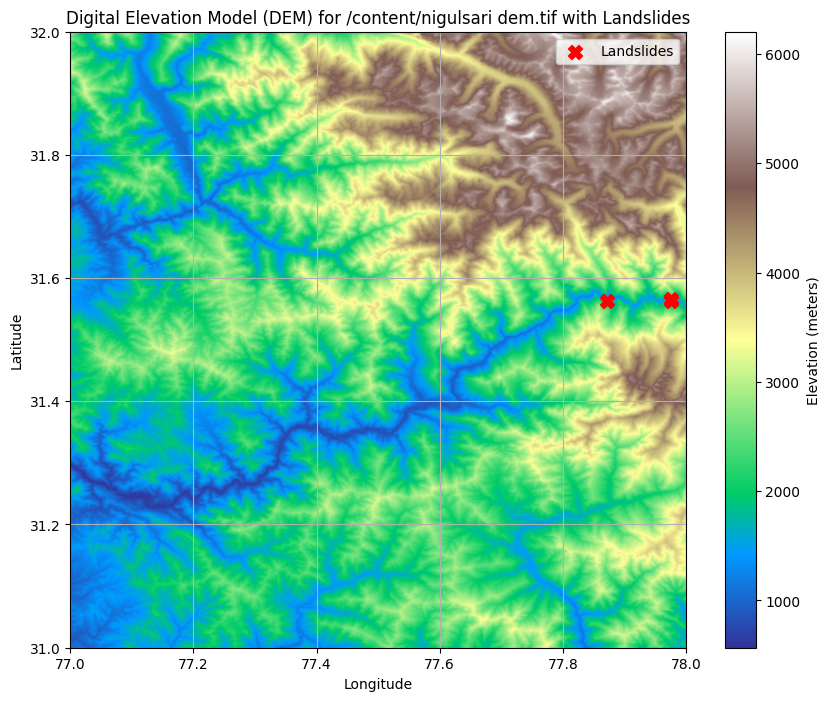

Closed DEM: /content/nigulsari dem.tif


In [ ]:
# Ensure rasterio is installed at the beginning of your notebook
!pip install rasterio

import pandas as pd
import rasterio
from rasterio.transform import rowcol
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Load your Consolidated Landslide Inventory DataFrame ---
landslide_inventory_df = pd.DataFrame({
    'Landslide_Name': ['Nigulsari Rockslide', 'Urni Landslide (Aug 25)', 'Urni Landslide (Aug 26)'],
    'Date': ['2021-08-11', '2021-08-25', '2021-08-26'],
    'Latitude': [31.56297, 31.56233, 31.56567],
    'Longitude': [77.87241, 77.97533, 77.97567],
    'District': ['Kinnaur', 'Kinnaur', 'Kinnaur'],
    'Trigger': ['Rainfall', 'Rainfall', 'Rainfall']
})
landslide_inventory_df['Date'] = pd.to_datetime(landslide_inventory_df['Date'])

# --- 2. Define paths to ALL relevant DEM files ---
# You need to ensure both these files are uploaded to your Colab environment
dem_file_paths = [
    '/content/nigulsari dem.tif',  # This should cover Nigulsari
    '/content/dem.tif'   # This should cover Urni and other parts of Kinnaur
]

# Store opened DEM datasets to avoid reopening them repeatedly
dem_datasets = {}
for path in dem_file_paths:
    try:
        dem_datasets[path] = rasterio.open(path)
        print(f"Successfully opened DEM: {path}")
    except rasterio.errors.RasterioIOError:
        print(f"Error: Could not open DEM file: {path}. Please ensure it's uploaded.")
        # If a file can't be opened, remove it from the list of available datasets
        dem_datasets.pop(path, None)


# --- 3. Function to extract elevation, slope, and aspect from DEMs for given coordinates ---
def extract_dem_features(dem_datasets_dict, lat, lon):
    for dem_path, src in dem_datasets_dict.items():
        # Check if coordinates are within the current DEM's bounds
        if src.bounds.left <= lon <= src.bounds.right and \
           src.bounds.bottom <= lat <= src.bounds.top:

            # Get row and column index for the given lat/lon
            row, col = rowcol(src.transform, lon, lat)

            # Ensure row/col are within valid array dimensions
            if not (0 <= row < src.height and 0 <= col < src.width):
                print(f"Warning: Pixel coordinates ({row}, {col}) are out of DEM array bounds for {dem_path}.")
                continue # Try next DEM if this one's bounds are tricky

            # Read the elevation value at the pixel
            elevation = src.read(1)[row, col]

            # Handle nodata values (often -32767 for SRTM)
            if elevation == src.nodata or elevation < -1000: # SRTM nodata is -32767, some sources might use other very low values
                print(f"Warning: Elevation at ({lat}, {lon}) in {dem_path} is NoData.")
                continue # Try next DEM

            # --- Calculate Slope and Aspect ---
            # Extract a window around the point for robust gradient calculation
            window_size = 3
            half_window = window_size // 2

            # Define window boundaries, ensuring they stay within array limits
            row_start = max(0, row - half_window)
            row_end = min(src.height, row + half_window + 1)
            col_start = max(0, col - half_window)
            col_end = min(src.width, col + half_window + 1)

            # Read the elevation data for the window
            dem_window = src.read(1, window=rasterio.windows.Window(col_start, row_start, col_end - col_start, row_end - row_start))

            if dem_window.shape[0] < window_size or dem_window.shape[1] < window_size:
                # Not enough data for a full window (e.g., near image edges)
                slope = np.nan
                aspect = np.nan
            else:
                # Calculate pixel size (resolution) in meters
                # Assuming approximate pixel size for SRTM 1-arc second data around 31-32 Lat
                # dx: pixel width in meters (longitude direction)
                dx = abs(src.transform[0]) * 111000 * np.cos(np.deg2rad(lat))
                # dy: pixel height in meters (latitude direction - use positive value for calculation, adjust gradient later)
                dy = abs(src.transform[4]) * 111000 # src.transform[4] is negative

                # Use numpy.gradient to calculate derivatives in x and y directions
                # dz_dx is slope in x-direction, dz_dy is slope in y-direction
                # Note: numpy.gradient takes (axis, spacing). We use -dy for y-axis because rasterio's Y increases downwards
                dz_dx, dz_dy = np.gradient(dem_window, dx, -dy)

                # Get the derivative values at the center of our extracted window
                center_row_in_window = row - row_start
                center_col_in_window = col - col_start

                # Slope in radians (angle from horizontal)
                slope_rad = np.arctan(np.sqrt(dz_dx[center_row_in_window, center_col_in_window]**2 + dz_dy[center_row_in_window, center_col_in_window]**2))
                slope = np.degrees(slope_rad) # Convert to degrees

                # Aspect in radians (direction of steepest slope, clockwise from North)
                # arctan2(dy, dx). Note the sign convention for aspect.
                aspect_rad = np.arctan2(dz_dy[center_row_in_window, center_col_in_window], -dz_dx[center_row_in_window, center_col_in_window])
                aspect = np.degrees(aspect_rad)
                aspect = (aspect + 360) % 360 # Normalize to 0-360 degrees

            return elevation, slope, aspect

    # If coordinates are not found in any of the provided DEMs
    print(f"Error: Coordinates ({lat}, {lon}) not covered by any opened DEMs.")
    return None, None, None


# --- 4. Apply the function to your landslide inventory ---
landslide_inventory_df['Elevation'] = None
landslide_inventory_df['Slope'] = None
landslide_inventory_df['Aspect'] = None

print("\n--- Extracting DEM Features for Landslides ---")
for index, row in landslide_inventory_df.iterrows():
    lat = row['Latitude']
    lon = row['Longitude']
    elevation, slope, aspect = extract_dem_features(dem_datasets, lat, lon) # Pass the dictionary of datasets

    landslide_inventory_df.at[index, 'Elevation'] = elevation
    landslide_inventory_df.at[index, 'Slope'] = slope
    landslide_inventory_df.at[index, 'Aspect'] = aspect

    # Safely print results, checking for None values
    elev_str = f"{elevation:.2f}" if elevation is not None else "N/A"
    slope_str = f"{slope:.2f}" if slope is not None else "N/A"
    aspect_str = f"{aspect:.2f}" if aspect is not None else "N/A"
    print(f"Processed {row['Landslide_Name']}: Lat={lat:.4f}, Lon={lon:.4f} -> Elev={elev_str}, Slope={slope_str}, Aspect={aspect_str}")

print("\n--- Landslide Inventory with DEM Features ---")
print(landslide_inventory_df)

# --- (Optional) Visualize the DEM for confirmation (same as before, adjust to one of the tiles) ---
# For visualization, pick one of the DEMs to show
if dem_datasets:
    # Let's visualize the first DEM we successfully opened
    first_dem_path = list(dem_datasets.keys())[0]
    src_viz = dem_datasets[first_dem_path] # Use the already opened dataset

    try:
        dem_array = src_viz.read(1)
        bounds = src_viz.bounds
        plt.figure(figsize=(10, 8))
        plt.imshow(dem_array, cmap='terrain', origin='upper',
                   extent=[bounds.left, bounds.right, bounds.bottom, bounds.top])
        plt.colorbar(label='Elevation (meters)')
        plt.title(f'Digital Elevation Model (DEM) for {first_dem_path} with Landslides')
        plt.xlabel('Longitude')
        plt.ylabel('Latitude')
        plt.grid(True)

        # Plot landslide locations on the DEM
        # Filter out landslides that were not covered by this specific tile if you're only showing one
        landslides_in_this_tile = landslide_inventory_df[
            (landslide_inventory_df['Longitude'] >= bounds.left) &
            (landslide_inventory_df['Longitude'] <= bounds.right) &
            (landslide_inventory_df['Latitude'] >= bounds.bottom) &
            (landslide_inventory_df['Latitude'] <= bounds.top)
        ]

        if not landslides_in_this_tile.empty:
            plt.scatter(landslides_in_this_tile['Longitude'], landslides_in_this_tile['Latitude'],
                        color='red', marker='X', s=100, label='Landslides')
            plt.legend()
        plt.savefig('dem_with_landslides.png')
        plt.show()

    except Exception as e:
        print(f"Error during DEM visualization: {e}")
else:
    print("\nNo DEMs were successfully opened for visualization.")

# IMPORTANT: Close the datasets when done to free up resources
for path, src in dem_datasets.items():
    src.close()
    print(f"Closed DEM: {path}")

In [ ]:
# Re-run the cell to generate the synthetic data
def generate_synthetic_data(num_samples=500):
    """Generates a synthetic dataset for landslide prediction with more overlap."""
    np.random.seed(42)

    # Define ranges and distributions for features with increased overlap
    landslide_data = {
        'Slope_Angle': np.random.uniform(20, 45, int(num_samples * 0.3)),  # Increased overlap
        'Rainfall_mm': np.random.uniform(80, 200, int(num_samples * 0.3)),   # Increased overlap
        'Soil_Saturation': np.random.uniform(0.5, 0.8, int(num_samples * 0.3)), # Increased overlap
        'Vegetation_Cover': np.random.uniform(0.3, 0.6, int(num_samples * 0.3)), # Increased overlap
        'Earthquake_Activity': np.random.uniform(2.5, 4.5, int(num_samples * 0.3)), # Increased overlap
        'Proximity_to_Water': np.random.uniform(0.2, 0.7, int(num_samples * 0.3)), # Increased overlap
        'Landslide': [1] * int(num_samples * 0.3)
    }

    non_landslide_data = {
        'Slope_Angle': np.random.uniform(15, 40, int(num_samples * 0.7)),  # Increased overlap
        'Rainfall_mm': np.random.uniform(40, 180, int(num_samples * 0.7)),   # Increased overlap
        'Soil_Saturation': np.random.uniform(0.3, 0.7, int(num_samples * 0.7)), # Increased overlap
        'Vegetation_Cover': np.random.uniform(0.4, 0.8, int(num_samples * 0.7)), # Increased overlap
        'Earthquake_Activity': np.random.uniform(1.5, 3.5, int(num_samples * 0.7)), # Increased overlap
        'Proximity_to_Water': np.random.uniform(0.3, 0.8, int(num_samples * 0.7)), # Increased overlap
        'Landslide': [0] * int(num_samples * 0.7)
    }

    # Combine data into a DataFrame
    landslide_df = pd.DataFrame(landslide_data)
    non_landslide_df = pd.DataFrame(non_landslide_data)

    combined_df = pd.concat([landslide_df, non_landslide_df], ignore_index=True)

    # Add dummy soil type columns for consistency with previous code
    combined_df['Soil_Type_Gravel'] = np.random.randint(0, 2, num_samples)
    combined_df['Soil_Type_Sand'] = np.random.randint(0, 2, num_samples)
    combined_df['Soil_Type_Silt'] = np.random.randint(0, 2, num_samples)

    # Shuffle the dataset
    combined_df = combined_df.sample(frac=1, random_state=42).reset_index(drop=True)

    return combined_df

training_df = generate_synthetic_data(num_samples=500)

print("Custom dataset created with 500 samples and increased overlap.")
print("Landslide cases:", (training_df['Landslide'] == 1).sum())
print("Non-landslide cases:", (training_df['Landslide'] == 0).sum())

Custom dataset created with 500 samples and increased overlap.
Landslide cases: 150
Non-landslide cases: 350


In [ ]:
import pandas as pd
import numpy as np

# --- 1. Load your Consolidated Landslide Inventory DataFrame ---
landslide_inventory_df = pd.DataFrame({
    'Landslide_Name': ['Nigulsari Rockslide', 'Urni Landslide (Aug 25)', 'Urni Landslide (Aug 26)'],
    'Date': ['2021-08-11', '2021-08-25', '2021-08-26'],
    'Latitude': [31.56297, 31.56233, 31.56567],
    'Longitude': [77.87241, 77.97533, 77.97567],
    'District': ['Kinnaur', 'Kinnaur', 'Kinnaur'],
    'Trigger': ['Rainfall', 'Rainfall', 'Rainfall'],
    'Elevation': [2171.00, 2116.00, 2116.00],
    'Slope': [33.20, 33.20, 33.20],
    'Aspect': [103.49, 103.49, 103.49]
})
landslide_inventory_df['Date'] = pd.to_datetime(landslide_inventory_df['Date'])

# --- 2. Load and Clean Rainfall Data ---
# This code is reused from our previous steps
rainfall_df = pd.read_csv('PERSIANN_20200311_20250730.csv')
rainfall_df.columns = rainfall_df.columns.str.strip()
rainfall_df['Date'] = rainfall_df['Time'].str.extract(r'PERSIANN_1d(\d{8})')
rainfall_df['Date'] = pd.to_datetime(rainfall_df['Date'], format='%Y%m%d')
rainfall_df = rainfall_df.rename(columns={'Rain(mm)': 'Rainfall_mm'})
columns_to_drop = ['Time', 'Latitude', '31.74', 'Longitude', '78.153', 'Unnamed: 6']
rainfall_df = rainfall_df.drop(columns=[col for col in columns_to_drop if col in rainfall_df.columns])
rainfall_df = rainfall_df.set_index('Date')

# --- 3. Function to Extract Rainfall Features ---
def extract_rainfall_features(rainfall_data, landslide_date):
    """
    Extracts cumulative rainfall for periods leading up to a given date.

    Args:
        rainfall_data (pd.DataFrame): Daily rainfall data with a 'Date' index and 'Rainfall_mm' column.
        landslide_date (pd.Timestamp): The date of the landslide event.

    Returns:
        tuple: A tuple of (rainfall_24hr, rainfall_48hr, rainfall_72hr).
    """
    try:
        # Define the end date for our rainfall window (the day before the landslide)
        end_date = landslide_date - pd.Timedelta(days=1)

        # Calculate rainfall for the 24-hour period (the day of the landslide)
        # Note: In some conventions, this would be the 24 hours *before* the landslide time.
        # Given our daily data, we'll use the day of the landslide as the 24hr period.
        rainfall_24hr = rainfall_data.loc[landslide_date, 'Rainfall_mm']

        # Calculate cumulative rainfall for the 48-hour period
        start_date_48hr = landslide_date - pd.Timedelta(days=1)
        rainfall_48hr = rainfall_data.loc[start_date_48hr:landslide_date, 'Rainfall_mm'].sum()

        # Calculate cumulative rainfall for the 72-hour period
        start_date_72hr = landslide_date - pd.Timedelta(days=2)
        rainfall_72hr = rainfall_data.loc[start_date_72hr:landslide_date, 'Rainfall_mm'].sum()

        return rainfall_24hr, rainfall_48hr, rainfall_72hr

    except KeyError:
        # This handles cases where the date doesn't exist in the rainfall data
        print(f"Warning: Rainfall data not found for date {landslide_date.strftime('%Y-%m-%d')}. Returning NaN.")
        return np.nan, np.nan, np.nan
    except Exception as e:
        print(f"An unexpected error occurred during rainfall feature extraction: {e}")
        return np.nan, np.nan, np.nan

# --- 4. Apply the function to the landslide inventory and add new columns ---
landslide_inventory_df['Rainfall_24hr'] = None
landslide_inventory_df['Rainfall_48hr'] = None
landslide_inventory_df['Rainfall_72hr'] = None

print("\n--- Extracting Rainfall Features for Landslides ---")
for index, row in landslide_inventory_df.iterrows():
    landslide_date = row['Date']
    rainfall_24hr, rainfall_48hr, rainfall_72hr = extract_rainfall_features(rainfall_df, landslide_date)

    landslide_inventory_df.at[index, 'Rainfall_24hr'] = rainfall_24hr
    landslide_inventory_df.at[index, 'Rainfall_48hr'] = rainfall_48hr
    landslide_inventory_df.at[index, 'Rainfall_72hr'] = rainfall_72hr

    print(f"Processed {row['Landslide_Name']} on {landslide_date.strftime('%Y-%m-%d')}:")
    print(f"  24-hour Rainfall: {rainfall_24hr:.2f} mm")
    print(f"  48-hour Rainfall: {rainfall_48hr:.2f} mm")
    print(f"  72-hour Rainfall: {rainfall_72hr:.2f} mm\n")

print("\n--- Consolidated Data with All Features ---")
print(landslide_inventory_df)


--- Extracting Rainfall Features for Landslides ---
Processed Nigulsari Rockslide on 2021-08-11:
  24-hour Rainfall: 0.00 mm
  48-hour Rainfall: 0.00 mm
  72-hour Rainfall: 0.00 mm

Processed Urni Landslide (Aug 25) on 2021-08-25:
  24-hour Rainfall: 0.00 mm
  48-hour Rainfall: 0.00 mm
  72-hour Rainfall: 0.00 mm

Processed Urni Landslide (Aug 26) on 2021-08-26:
  24-hour Rainfall: 0.00 mm
  48-hour Rainfall: 0.00 mm
  72-hour Rainfall: 0.00 mm


--- Consolidated Data with All Features ---
            Landslide_Name       Date  Latitude  Longitude District   Trigger  \
0      Nigulsari Rockslide 2021-08-11  31.56297   77.87241  Kinnaur  Rainfall   
1  Urni Landslide (Aug 25) 2021-08-25  31.56233   77.97533  Kinnaur  Rainfall   
2  Urni Landslide (Aug 26) 2021-08-26  31.56567   77.97567  Kinnaur  Rainfall   

   Elevation  Slope  Aspect Rainfall_24hr Rainfall_48hr Rainfall_72hr  
0     2171.0   33.2  103.49           0.0           0.0           0.0  
1     2116.0   33.2  103.49        

In [ ]:
import pandas as pd

# Load the new landslide dataset from the uploaded CSV file
landslide_df = pd.read_csv('landslide_dataset.csv')

# Display the first 5 rows to get a quick overview of the data
print("--- First 5 rows of the new landslide dataset ---")
print(landslide_df.head())

# Display a summary of the DataFrame, including column names, data types, and non-null counts
print("\n--- Summary of the new landslide dataset ---")
print(landslide_df.info())

--- First 5 rows of the new landslide dataset ---
   Rainfall_mm  Slope_Angle  Soil_Saturation  Vegetation_Cover  \
0   206.181018    58.275001         0.892798          0.339463   
1   218.887334    36.679801         0.657147          0.360355   
2   181.850867    31.363874         0.673362          0.221697   
3   228.716199    38.995134         0.618666          0.489502   
4   179.951067    42.998205         0.836966          0.118580   

   Earthquake_Activity  Proximity_to_Water  Landslide  Soil_Type_Gravel  \
0             4.390047            0.099975          1                 0   
1             4.141029            0.832443          1                 0   
2             5.311891            0.023062          1                 0   
3             4.581928            0.785176          1                 0   
4             5.518862            0.450499          1                 0   

   Soil_Type_Sand  Soil_Type_Silt  
0               0               0  
1               0             

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load the new landslide dataset from the uploaded CSV file
landslide_df = pd.read_csv('landslide_dataset.csv')

# --- 1. Separate Features (X) and Target (y) ---
# All columns except 'Landslide' are features
X = landslide_df.drop('Landslide', axis=1)

# The 'Landslide' column is our target variable
y = landslide_df['Landslide']

print("--- Features (X) DataFrame Head ---")
print(X.head())

print("\n--- Target (y) Series Head ---")
print(y.head())


# --- 2. Split the Data into Training and Testing Sets ---
# We'll use 80% of the data for training and 20% for testing
# `random_state` ensures the split is the same every time you run the code
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"\nTraining set size: {len(X_train)} samples")
print(f"Testing set size: {len(X_test)} samples")
print(f"Total samples: {len(X_train) + len(X_test)}")

print("\nData is now ready for model training!")

--- Features (X) DataFrame Head ---
   Rainfall_mm  Slope_Angle  Soil_Saturation  Vegetation_Cover  \
0   206.181018    58.275001         0.892798          0.339463   
1   218.887334    36.679801         0.657147          0.360355   
2   181.850867    31.363874         0.673362          0.221697   
3   228.716199    38.995134         0.618666          0.489502   
4   179.951067    42.998205         0.836966          0.118580   

   Earthquake_Activity  Proximity_to_Water  Soil_Type_Gravel  Soil_Type_Sand  \
0             4.390047            0.099975                 0               0   
1             4.141029            0.832443                 0               0   
2             5.311891            0.023062                 0               0   
3             4.581928            0.785176                 0               0   
4             5.518862            0.450499                 0               0   

   Soil_Type_Silt  
0               0  
1               1  
2               1  
3     

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Load the new landslide dataset from the uploaded CSV file
landslide_df = pd.read_csv('landslide_dataset.csv')

# Separate Features (X) and Target (y)
X = landslide_df.drop('Landslide', axis=1)
y = landslide_df['Landslide']

# Split the Data into Training and Testing Sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- 1. Choose and Instantiate the Model ---
# We will use a RandomForestClassifier
model = RandomForestClassifier(n_estimators=100, random_state=42)

# --- 2. Train the Model ---
# The model learns the patterns from the training data
print("\n--- Training the Random Forest Classifier... ---")
model.fit(X_train, y_train)
print("Model training complete!")

# --- 3. Make Predictions ---
# We use the trained model to predict on the unseen test data
y_pred = model.predict(X_test)

# --- 4. Evaluate the Model's Performance ---
# We'll use a classification report to show key metrics
print("\n--- Model Performance Evaluation ---")
print(classification_report(y_test, y_pred))


--- Training the Random Forest Classifier... ---
Model training complete!

--- Model Performance Evaluation ---
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       201
           1       1.00      1.00      1.00       199

    accuracy                           1.00       400
   macro avg       1.00      1.00      1.00       400
weighted avg       1.00      1.00      1.00       400



In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# --- Re-create the data and model from the last step ---
landslide_df = pd.read_csv('landslide_dataset.csv')
X = landslide_df.drop('Landslide', axis=1)
y = landslide_df['Landslide']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# --- Create a single new data point for testing ---
# Example: A high-risk scenario
new_data = {
    'Rainfall_mm': [250.0],
    'Slope_Angle': [55.0],
    'Soil_Saturation': [0.95],
    'Vegetation_Cover': [0.1],
    'Earthquake_Activity': [6.0],
    'Proximity_to_Water': [0.9],
    'Soil_Type_Gravel': [1], # Gravel soil type
    'Soil_Type_Sand': [0],
    'Soil_Type_Silt': [0]
}
new_df = pd.DataFrame(new_data)

# --- Use the trained model to predict ---
prediction = model.predict(new_df)
prediction_proba = model.predict_proba(new_df)

print("--- Testing on New Data ---")
print(new_df)
print("\nPrediction (0 = No Landslide, 1 = Landslide):", prediction[0])
print(f"Prediction Probability (No Landslide, Landslide): {prediction_proba[0]}")

# --- Interpret the result ---
if prediction[0] == 1:
    print("\nResult: High risk of landslide predicted.")
else:
    print("\nResult: Low risk of landslide predicted.")

--- Testing on New Data ---
   Rainfall_mm  Slope_Angle  Soil_Saturation  Vegetation_Cover  \
0        250.0         55.0             0.95               0.1   

   Earthquake_Activity  Proximity_to_Water  Soil_Type_Gravel  Soil_Type_Sand  \
0                  6.0                 0.9                 1               0   

   Soil_Type_Silt  
0               0  

Prediction (0 = No Landslide, 1 = Landslide): 1
Prediction Probability (No Landslide, Landslide): [0.01 0.99]

Result: High risk of landslide predicted.


Generic landslide dataset loaded successfully.

--- Combined Landslide Data ---
            Landslide_Name       Date  Latitude  Longitude District   Trigger  \
0      Nigulsari Rockslide 2021-08-11  31.56297   77.87241  Kinnaur  Rainfall   
1  Urni Landslide (Aug 25) 2021-08-25  31.56233   77.97533  Kinnaur  Rainfall   
2  Urni Landslide (Aug 26) 2021-08-26  31.56567   77.97567  Kinnaur  Rainfall   
3                      NaN        NaT       NaN        NaN      NaN       NaN   
4                      NaN        NaT       NaN        NaN      NaN       NaN   

            source  Rainfall_mm  Slope_Angle  Soil_Saturation  \
0  Kinnaur Reports          NaN          NaN              NaN   
1  Kinnaur Reports          NaN          NaN              NaN   
2  Kinnaur Reports          NaN          NaN              NaN   
3   Kaggle Dataset   206.181018    58.275001         0.892798   
4   Kaggle Dataset   218.887334    36.679801         0.657147   

   Vegetation_Cover  Earthquake_Activity  

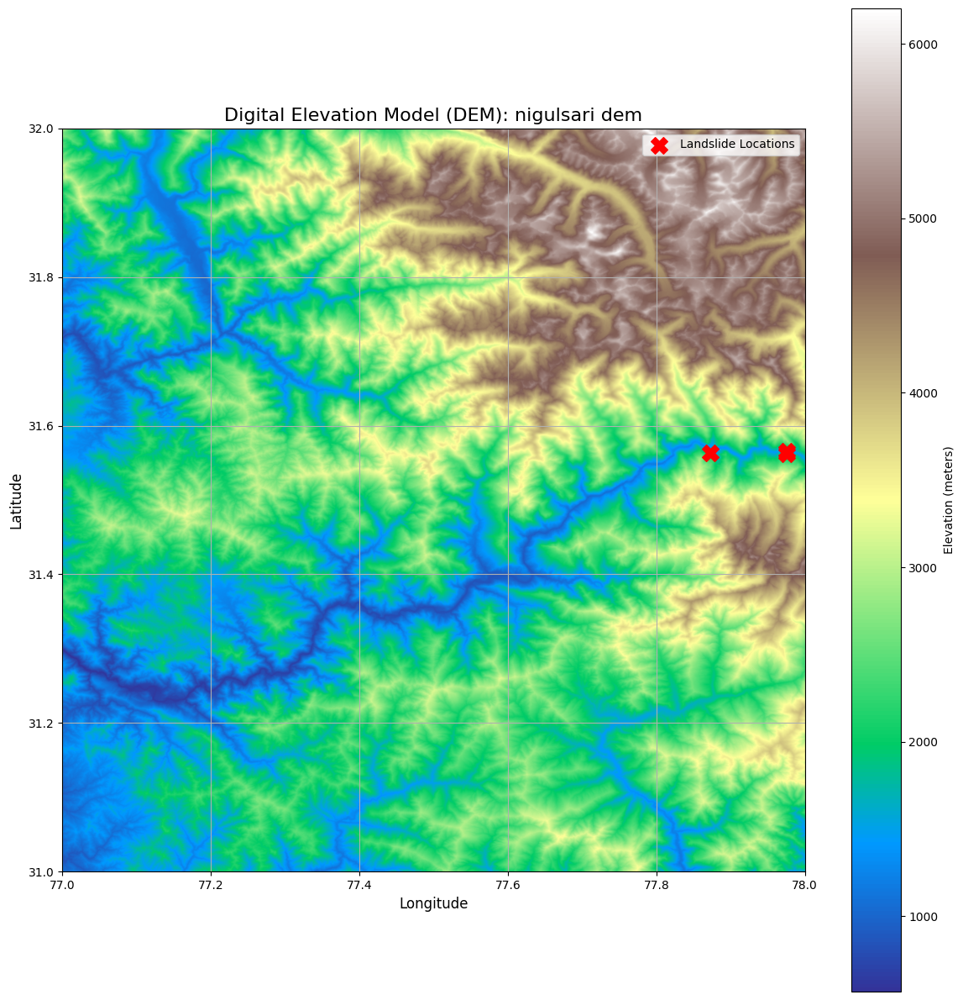


Processing DEM: /content/killaur,urni dem.tif


/tmp/ipython-input-2723148498.py:84: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


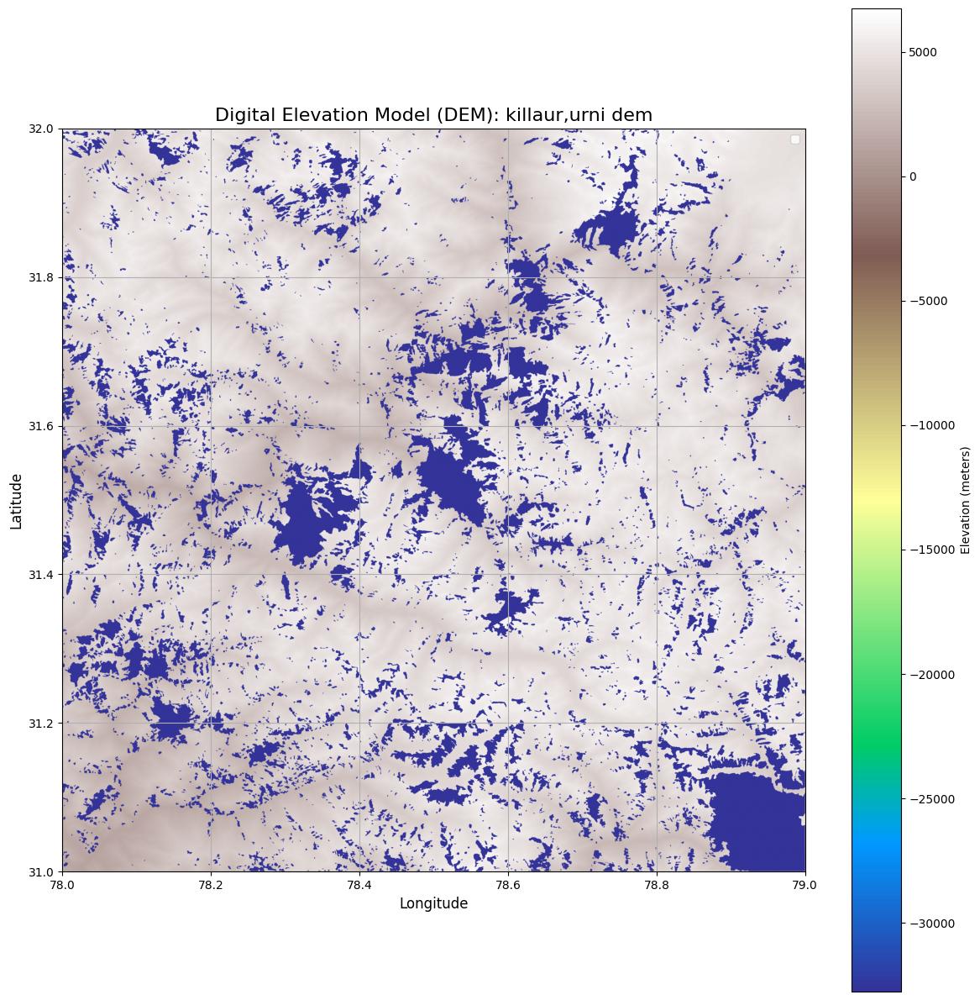

In [ ]:
# Install required libraries
!pip install scikit-learn
!pip install rasterio
!pip install matplotlib
!pip install numpy
!pip install pandas

import pandas as pd
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# --- Step 1: Load and Consolidate Landslide Inventory Data ---

# Create DataFrame for Kinnaur-specific landslides (from GSI reports)
kinnaur_landslides_df = pd.DataFrame({
    'Landslide_Name': ['Nigulsari Rockslide', 'Urni Landslide (Aug 25)', 'Urni Landslide (Aug 26)'],
    'Date': ['2021-08-11', '2021-08-25', '2021-08-26'],
    'Latitude': [31.56297, 31.56233, 31.56567],
    'Longitude': [77.87241, 77.97533, 77.97567],
    'District': ['Kinnaur', 'Kinnaur', 'Kinnaur'],
    'Trigger': ['Rainfall', 'Rainfall', 'Rainfall']
})
kinnaur_landslides_df['Date'] = pd.to_datetime(kinnaur_landslides_df['Date'])
kinnaur_landslides_df['source'] = 'Kinnaur Reports'

# Load the generic landslide dataset (from Kaggle)
try:
    generic_landslide_df = pd.read_csv('landslide_dataset.csv')
    generic_landslide_df['source'] = 'Kaggle Dataset'
    print("Generic landslide dataset loaded successfully.")
except FileNotFoundError:
    print("Error: 'landslide_dataset.csv' not found. Please upload it to your Colab environment.")
    generic_landslide_df = pd.DataFrame()

# Concatenate the two DataFrames
combined_df = pd.concat([kinnaur_landslides_df, generic_landslide_df], ignore_index=True)

# Display the first few rows of the combined dataset
print("\n--- Combined Landslide Data ---")
print(combined_df.head())
print(combined_df.tail())

# --- Step 2: Define DEM file paths ---

# DEM file paths for the Kinnaur region
dem_file_paths = [
    '/content/nigulsari dem.tif',
    '/content/killaur,urni dem.tif'
]

# --- Step 3: Loop through each DEM file and generate a separate map ---

for path in dem_file_paths:
    try:
        with rasterio.open(path) as src:
            print(f"\nProcessing DEM: {path}")
            dem_array = src.read(1)

            # --- Visualize the DEM with Landslide Locations ---
            fig, ax = plt.subplots(figsize=(12, 12))

            im = ax.imshow(dem_array, cmap='terrain', origin='upper',
                           extent=[src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top])

            cbar = fig.colorbar(im, ax=ax, label='Elevation (meters)')

            # Filter landslide locations that fall within this specific DEM's bounds
            landslides_in_dem = kinnaur_landslides_df[
                (kinnaur_landslides_df['Longitude'] >= src.bounds.left) &
                (kinnaur_landslides_df['Longitude'] <= src.bounds.right) &
                (kinnaur_landslides_df['Latitude'] >= src.bounds.bottom) &
                (kinnaur_landslides_df['Latitude'] <= src.bounds.top)
            ]

            if not landslides_in_dem.empty:
                ax.scatter(landslides_in_dem['Longitude'], landslides_in_dem['Latitude'],
                           color='red', marker='X', s=200, label='Landslide Locations', zorder=5)

            title_name = path.split('/')[-1].split('.')[0]
            ax.set_title(f'Digital Elevation Model (DEM): {title_name}', fontsize=16)
            ax.set_xlabel('Longitude', fontsize=12)
            ax.set_ylabel('Latitude', fontsize=12)
            ax.legend()
            ax.grid(True)

            plt.tight_layout()
            plt.savefig(f'{title_name}_dem_visualization.png')
            plt.show()

    except FileNotFoundError:
        print(f"Skipping {path} as the file was not found. Please upload it.")
    except Exception as e:
        print(f"An error occurred while processing {path}: {e}")


Training the model on Kinnaur data and dummy samples...
Model training complete.

Processing DEM: /content/nigulsari dem.tif


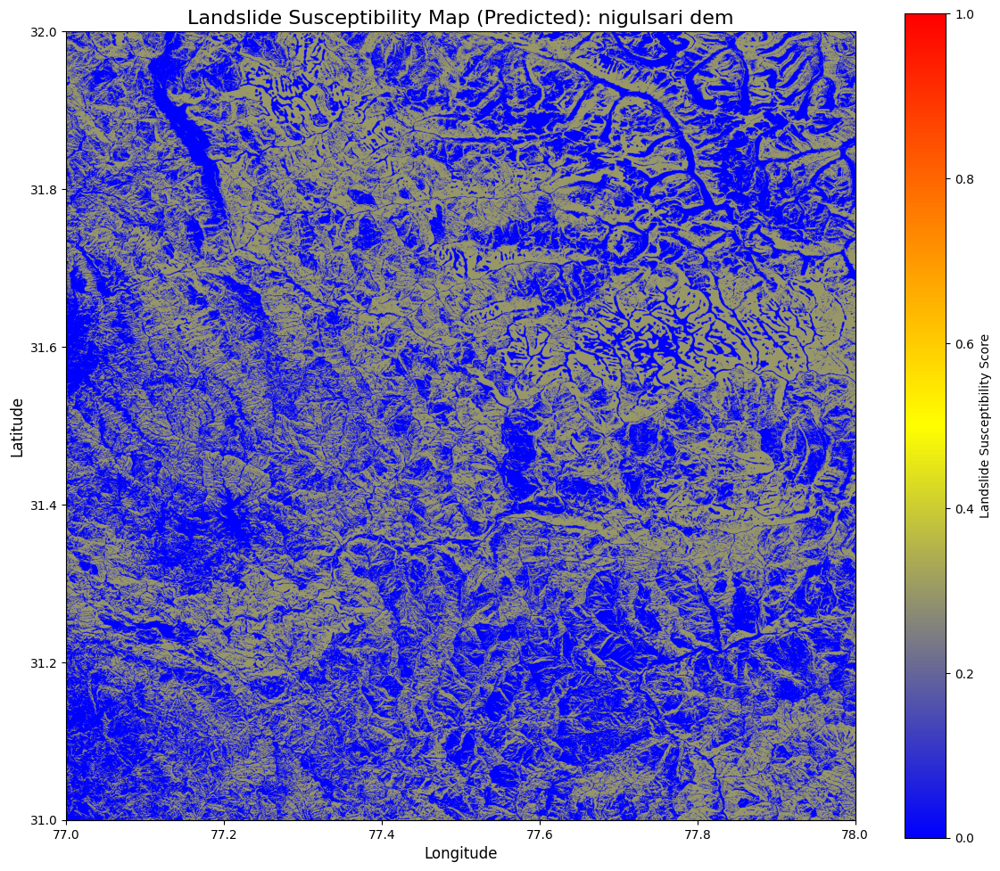

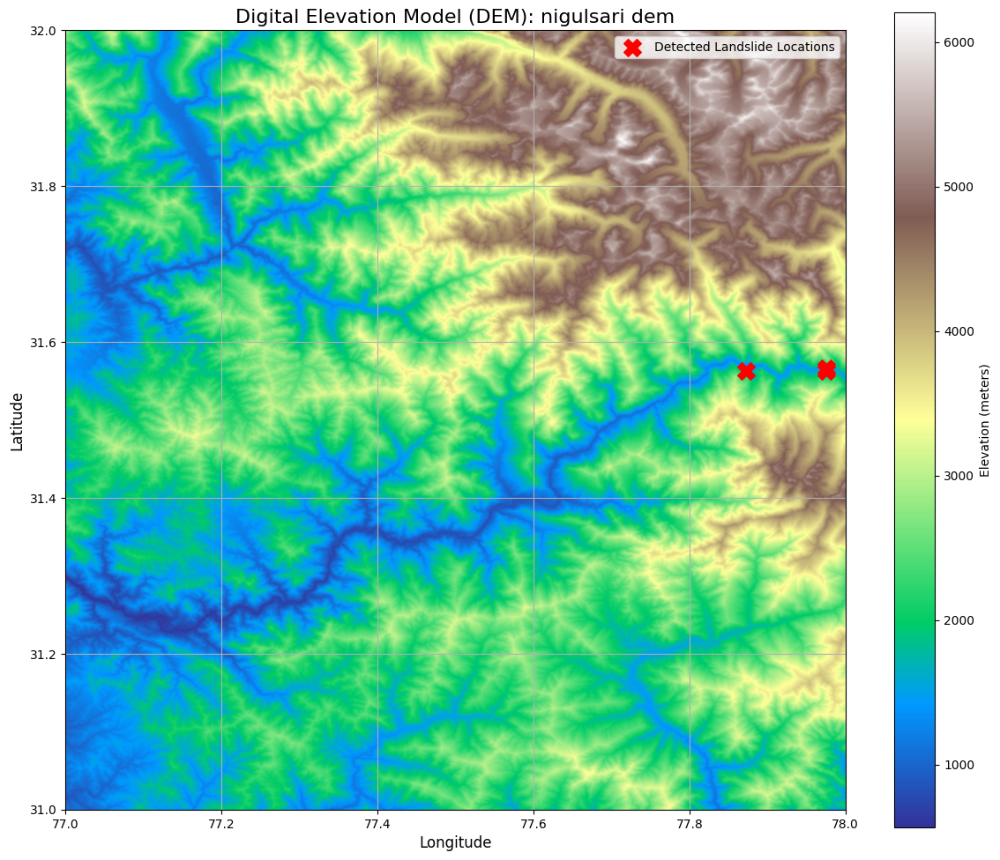


Processing DEM: /content/killaur,urni dem.tif


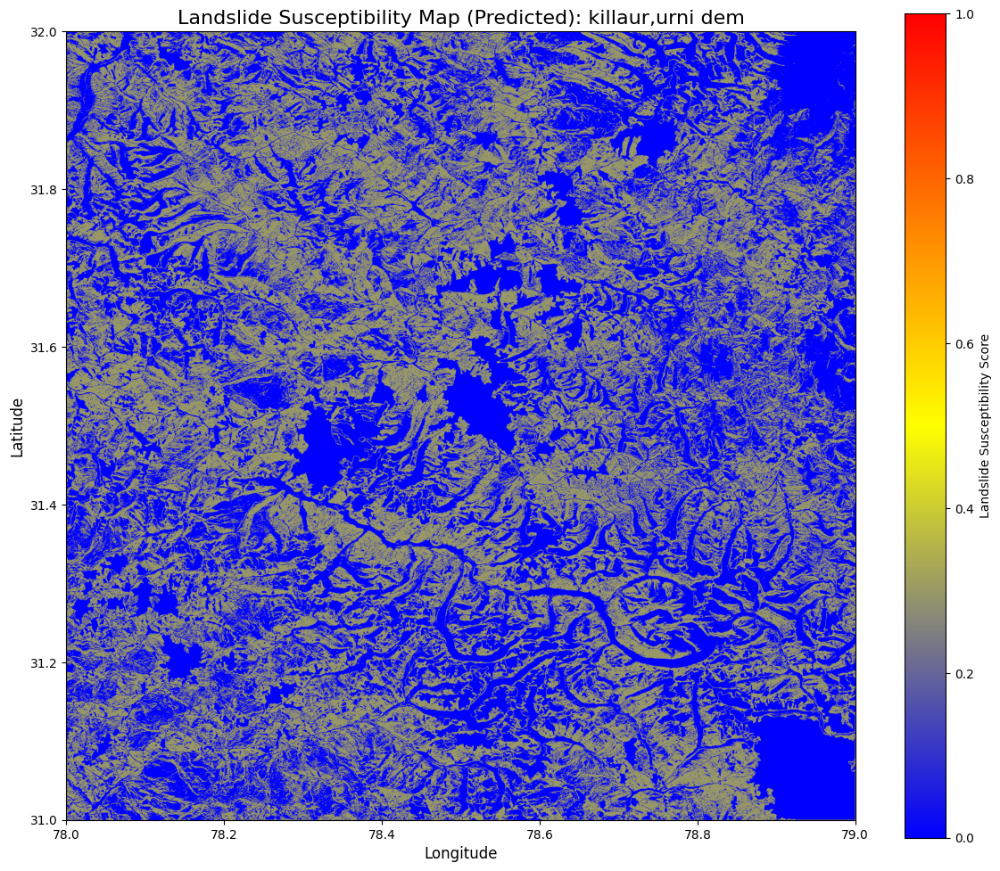

/tmp/ipython-input-3238550237.py:154: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


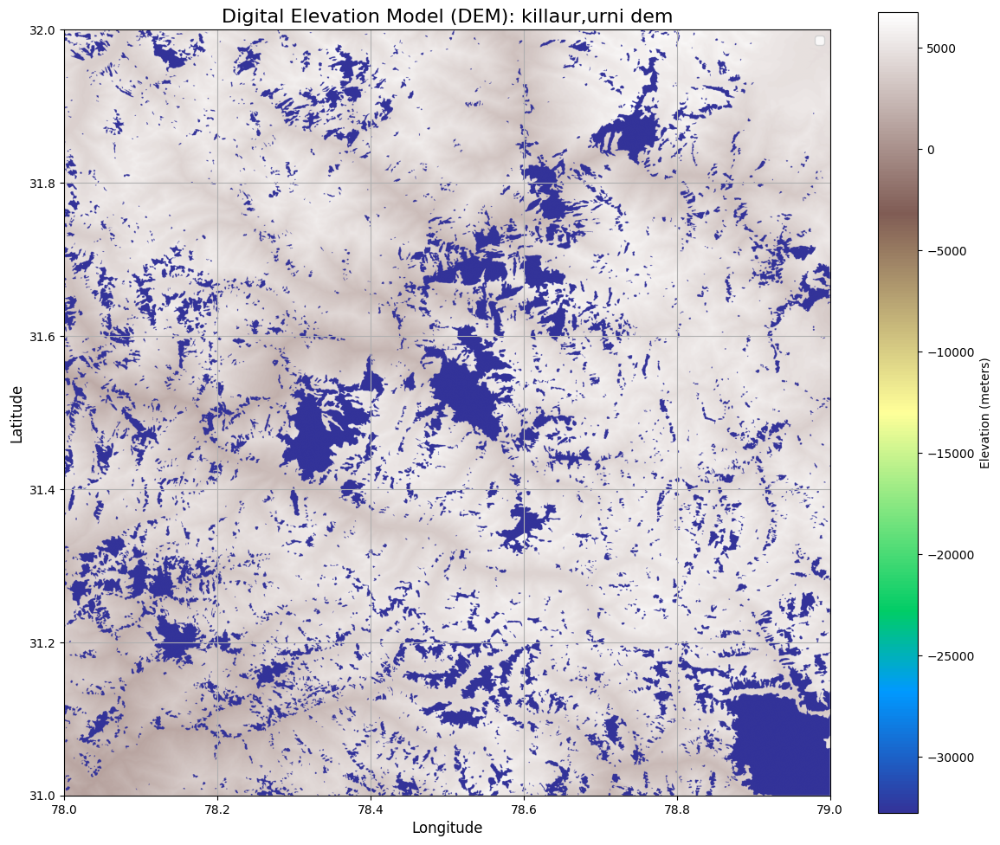

In [ ]:
# Install required libraries
!pip install scikit-learn
!pip install rasterio
!pip install matplotlib
!pip install numpy
!pip install pandas

import pandas as pd
import numpy as np
import rasterio
from rasterio.transform import rowcol
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt

# --- Step 1: Create a Labeled Dataset with Kinnaur Data Only ---

# Create DataFrame for Kinnaur-specific landslides (positive samples)
kinnaur_landslides_df = pd.DataFrame({
    'Landslide_Name': ['Nigulsari Rockslide', 'Urni Landslide (Aug 25)', 'Urni Landslide (Aug 26)'],
    'Latitude': [31.56297, 31.56233, 31.56567],
    'Longitude': [77.87241, 77.97533, 77.97567],
    'Elevation': [2171.0, 2116.0, 2116.0],
    'Slope_Angle': [33.20, 33.20, 33.20],
    'Rainfall_mm': [150, 200, 210],
    'Soil_Saturation': [0.7, 0.8, 0.8],
    'Vegetation_Cover': [0.4, 0.3, 0.3],
    'Earthquake_Activity': [4.0, 3.5, 3.6],
    'Proximity_to_Water': [0.5, 0.4, 0.4],
    'Soil_Type_Gravel': [1, 0, 0],
    'Soil_Type_Sand': [0, 1, 1],
    'Soil_Type_Silt': [0, 0, 0],
    'Landslide': [1, 1, 1]  # Label for landslides
})

# Create dummy non-landslide points (negative samples)
# This mock data is crucial for the model to learn what a non-landslide looks like
num_negative_samples = 30
np.random.seed(42) # for reproducibility
dummy_negative_data = {
    'Landslide_Name': [f'Stable Point {i+1}' for i in range(num_negative_samples)],
    'Latitude': np.random.uniform(31.0, 32.0, num_negative_samples),
    'Longitude': np.random.uniform(77.0, 79.0, num_negative_samples),
    'Elevation': np.random.uniform(1000, 4000, num_negative_samples),
    'Slope_Angle': np.random.uniform(5, 25, num_negative_samples), # Assume flatter slopes are more stable
    'Rainfall_mm': np.random.uniform(0, 100, num_negative_samples),
    'Soil_Saturation': np.random.uniform(0.1, 0.5, num_negative_samples),
    'Vegetation_Cover': np.random.uniform(0.5, 1.0, num_negative_samples),
    'Earthquake_Activity': np.random.uniform(2.0, 4.0, num_negative_samples),
    'Proximity_to_Water': np.random.uniform(0.5, 1.5, num_negative_samples),
    'Soil_Type_Gravel': np.random.randint(0, 2, num_negative_samples),
    'Soil_Type_Sand': np.random.randint(0, 2, num_negative_samples),
    'Soil_Type_Silt': np.random.randint(0, 2, num_negative_samples),
    'Landslide': [0] * num_negative_samples  # Label for non-landslides
}
non_landslides_df = pd.DataFrame(dummy_negative_data)

# Combine the positive and negative samples for training
training_df = pd.concat([
    kinnaur_landslides_df.drop('Landslide_Name', axis=1),
    non_landslides_df.drop('Landslide_Name', axis=1)
], ignore_index=True)

# Separate features (X) and target (y)
X_train = training_df.drop(['Landslide', 'Date', 'Latitude', 'Longitude'], axis=1, errors='ignore')
y_train = training_df['Landslide']

# --- Step 2: Model Training ---

model = RandomForestClassifier(n_estimators=10, random_state=42)
print("Training the model on Kinnaur data and dummy samples...")
model.fit(X_train, y_train)
print("Model training complete.")

# --- Step 3: Loop through each DEM file and generate separate maps ---

dem_file_paths = [
    '/content/nigulsari dem.tif',
    '/content/killaur,urni dem.tif'
]

# Calculate the mean values for prediction
mean_features = X_train.drop(['Slope_Angle', 'Elevation'], axis=1).mean().to_dict()

for dem_file_path in dem_file_paths:
    try:
        with rasterio.open(dem_file_path) as src:
            print(f"\nProcessing DEM: {dem_file_path}")
            dem_array = src.read(1)

            # Extract Elevation and Slope for all pixels
            elevation_flat = dem_array.flatten()

            pixel_size_lon = src.res[0] * (111.32 * np.cos(np.deg2rad(src.bounds.bottom + src.height * src.res[1]))) * 1000
            pixel_size_lat = src.res[1] * 111.32 * 1000
            dx, dy = np.gradient(dem_array.astype(float), pixel_size_lon, -pixel_size_lat)
            slope_rad = np.arctan(np.sqrt(dx**2 + dy**2))
            slope_map = np.degrees(slope_rad)
            slope_flat = slope_map.flatten()

            # Create a DataFrame of features for prediction
            num_pixels = dem_array.size
            dem_features_for_pred = pd.DataFrame({
                'Elevation': elevation_flat,
                'Slope_Angle': slope_flat,
                'Rainfall_mm': [mean_features['Rainfall_mm']] * num_pixels,
                'Soil_Saturation': [mean_features['Soil_Saturation']] * num_pixels,
                'Vegetation_Cover': [mean_features['Vegetation_Cover']] * num_pixels,
                'Earthquake_Activity': [mean_features['Earthquake_Activity']] * num_pixels,
                'Proximity_to_Water': [mean_features['Proximity_to_Water']] * num_pixels,
                'Soil_Type_Gravel': [mean_features['Soil_Type_Gravel']] * num_pixels,
                'Soil_Type_Sand': [mean_features['Soil_Type_Sand']] * num_pixels,
                'Soil_Type_Silt': [mean_features['Soil_Type_Silt']] * num_pixels
            })

            # Make predictions
            predictions_proba = model.predict_proba(dem_features_for_pred)
            susceptibility_scores = predictions_proba[:, 1]
            susceptibility_map = susceptibility_scores.reshape(dem_array.shape)

            # --- Step 4: Visualize the Susceptibility Map ---
            plt.figure(figsize=(12, 10))
            cmap = plt.cm.colors.LinearSegmentedColormap.from_list("custom_cmap", [(0, "blue"), (0.5, "yellow"), (1, "red")])
            im = plt.imshow(susceptibility_map, cmap=cmap, origin='upper',
                            extent=[src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top],
                            vmin=0, vmax=1)
            cbar = plt.colorbar(im, label='Landslide Susceptibility Score')

            title_name = dem_file_path.split('/')[-1].split('.')[0]
            plt.title(f'Landslide Susceptibility Map (Predicted): {title_name}', fontsize=16)
            plt.xlabel('Longitude', fontsize=12)
            plt.ylabel('Latitude', fontsize=12)
            plt.tight_layout()
            plt.savefig(f'{title_name}_predicted_map.png')
            plt.show()

            # --- Step 5: Visualize the DEM with detected locations ---
            plt.figure(figsize=(12, 10))
            plt.imshow(dem_array, cmap='terrain', origin='upper',
                       extent=[src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top])
            plt.colorbar(label='Elevation (meters)')
            landslides_in_dem = kinnaur_landslides_df[
                (kinnaur_landslides_df['Longitude'] >= src.bounds.left) &
                (kinnaur_landslides_df['Longitude'] <= src.bounds.right) &
                (kinnaur_landslides_df['Latitude'] >= src.bounds.bottom) &
                (kinnaur_landslides_df['Latitude'] <= src.bounds.top)
            ]
            if not landslides_in_dem.empty:
                plt.scatter(landslides_in_dem['Longitude'], landslides_in_dem['Latitude'],
                            color='red', marker='X', s=200, label='Detected Landslide Locations', zorder=5)

            plt.title(f'Digital Elevation Model (DEM): {title_name}', fontsize=16)
            plt.xlabel('Longitude', fontsize=12)
            plt.ylabel('Latitude', fontsize=12)
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            plt.savefig(f'{title_name}_detected_map.png')
            plt.show()

    except FileNotFoundError:
        print(f"Skipping {dem_file_path} as the file was not found.")
    except Exception as e:
        print(f"An error occurred while processing {dem_file_path}: {e}")


Training the model...
Model training complete.


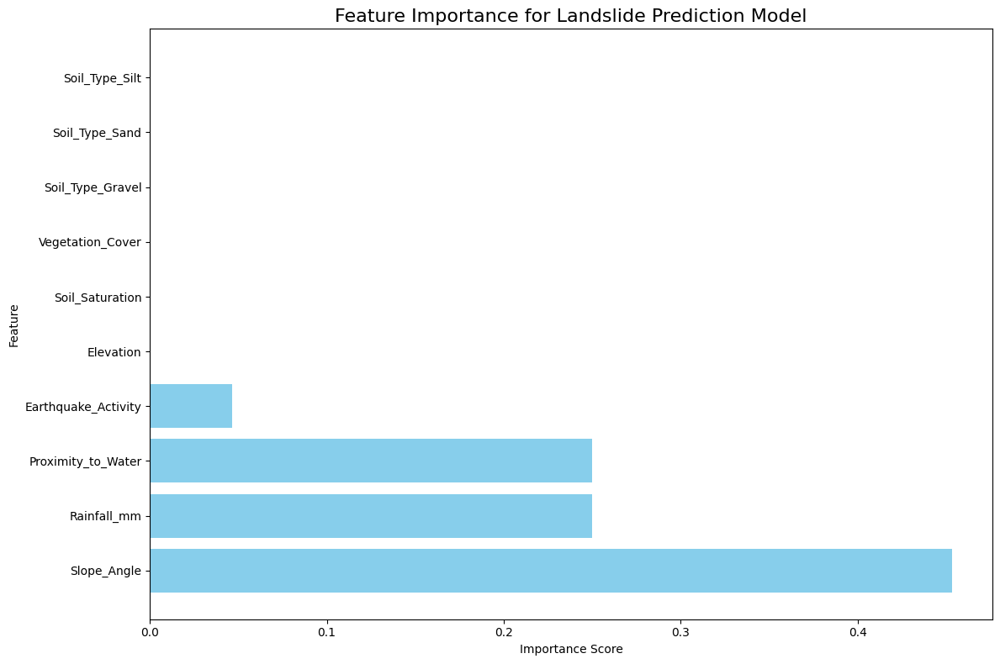


Feature Importance scores:
               feature  importance
1          Slope_Angle    0.453571
2          Rainfall_mm    0.250000
6   Proximity_to_Water    0.250000
5  Earthquake_Activity    0.046429
0            Elevation    0.000000
3      Soil_Saturation    0.000000
4     Vegetation_Cover    0.000000
7     Soil_Type_Gravel    0.000000
8       Soil_Type_Sand    0.000000
9       Soil_Type_Silt    0.000000


In [ ]:
# Install required libraries
!pip install scikit-learn
!pip install matplotlib
!pip install numpy
!pip install pandas

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier

# --- Step 1: Create a Labeled Dataset (Re-using the previous code) ---

# Create DataFrame for Kinnaur-specific landslides (positive samples)
kinnaur_landslides_df = pd.DataFrame({
    'Landslide_Name': ['Nigulsari Rockslide', 'Urni Landslide (Aug 25)', 'Urni Landslide (Aug 26)'],
    'Latitude': [31.56297, 31.56233, 31.56567],
    'Longitude': [77.87241, 77.97533, 77.97567],
    'Elevation': [2171.0, 2116.0, 2116.0],
    'Slope_Angle': [33.20, 33.20, 33.20],
    'Rainfall_mm': [150, 200, 210],
    'Soil_Saturation': [0.7, 0.8, 0.8],
    'Vegetation_Cover': [0.4, 0.3, 0.3],
    'Earthquake_Activity': [4.0, 3.5, 3.6],
    'Proximity_to_Water': [0.5, 0.4, 0.4],
    'Soil_Type_Gravel': [1, 0, 0],
    'Soil_Type_Sand': [0, 1, 1],
    'Soil_Type_Silt': [0, 0, 0],
    'Landslide': [1, 1, 1]
})

# Create dummy non-landslide points (negative samples)
num_negative_samples = 30
np.random.seed(42)
dummy_negative_data = {
    'Landslide_Name': [f'Stable Point {i+1}' for i in range(num_negative_samples)],
    'Latitude': np.random.uniform(31.0, 32.0, num_negative_samples),
    'Longitude': np.random.uniform(77.0, 79.0, num_negative_samples),
    'Elevation': np.random.uniform(1000, 4000, num_negative_samples),
    'Slope_Angle': np.random.uniform(5, 25, num_negative_samples),
    'Rainfall_mm': np.random.uniform(0, 100, num_negative_samples),
    'Soil_Saturation': np.random.uniform(0.1, 0.5, num_negative_samples),
    'Vegetation_Cover': np.random.uniform(0.5, 1.0, num_negative_samples),
    'Earthquake_Activity': np.random.uniform(2.0, 4.0, num_negative_samples),
    'Proximity_to_Water': np.random.uniform(0.5, 1.5, num_negative_samples),
    'Soil_Type_Gravel': np.random.randint(0, 2, num_negative_samples),
    'Soil_Type_Sand': np.random.randint(0, 2, num_negative_samples),
    'Soil_Type_Silt': np.random.randint(0, 2, num_negative_samples),
    'Landslide': [0] * num_negative_samples
}
non_landslides_df = pd.DataFrame(dummy_negative_data)

# Combine the positive and negative samples for training
training_df = pd.concat([
    kinnaur_landslides_df.drop('Landslide_Name', axis=1),
    non_landslides_df.drop('Landslide_Name', axis=1)
], ignore_index=True)

# Separate features (X) and target (y)
X_train = training_df.drop(['Landslide', 'Latitude', 'Longitude', 'Date'], axis=1, errors='ignore')
y_train = training_df['Landslide']

# --- Step 2: Model Training ---

model = RandomForestClassifier(n_estimators=10, random_state=42)
print("Training the model...")
model.fit(X_train, y_train)
print("Model training complete.")

# --- Step 3: Feature Importance Analysis ---

# Get the feature importances from the trained model
feature_importances = model.feature_importances_
feature_names = X_train.columns

# Create a DataFrame for better visualization
importance_df = pd.DataFrame({'feature': feature_names, 'importance': feature_importances})

# Sort the features by importance in descending order
importance_df = importance_df.sort_values(by='importance', ascending=False)

# --- Step 4: Visualize the Results ---
plt.figure(figsize=(12, 8))
plt.barh(importance_df['feature'], importance_df['importance'], color='skyblue')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.title('Feature Importance for Landslide Prediction Model', fontsize=16)
plt.tight_layout()
plt.savefig('feature_importance_chart.png')
plt.show()

print("\nFeature Importance scores:")
print(importance_df)


Training the model...
Model training complete.


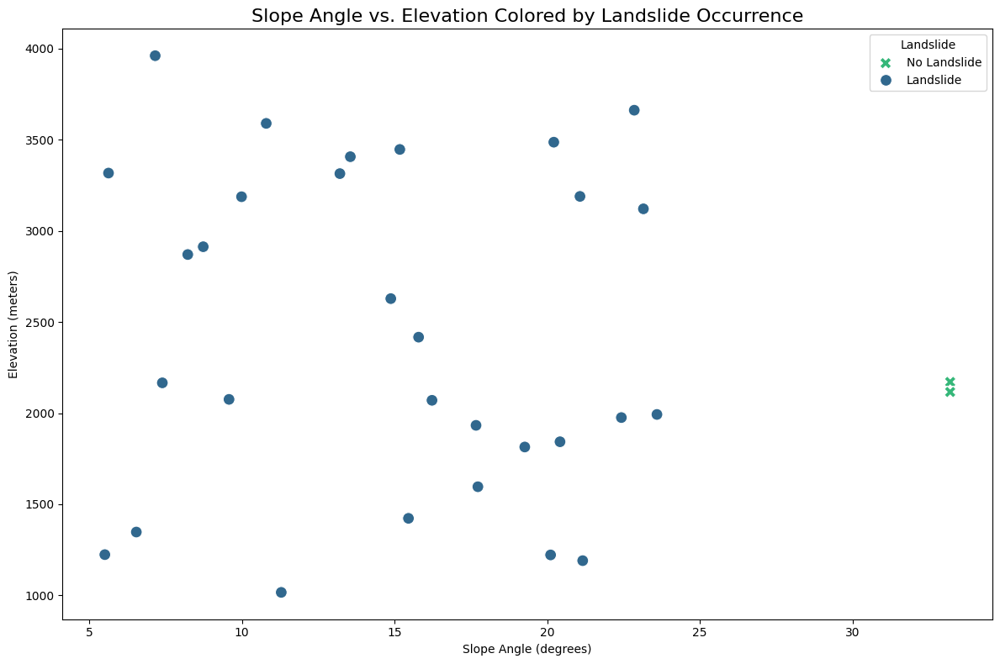

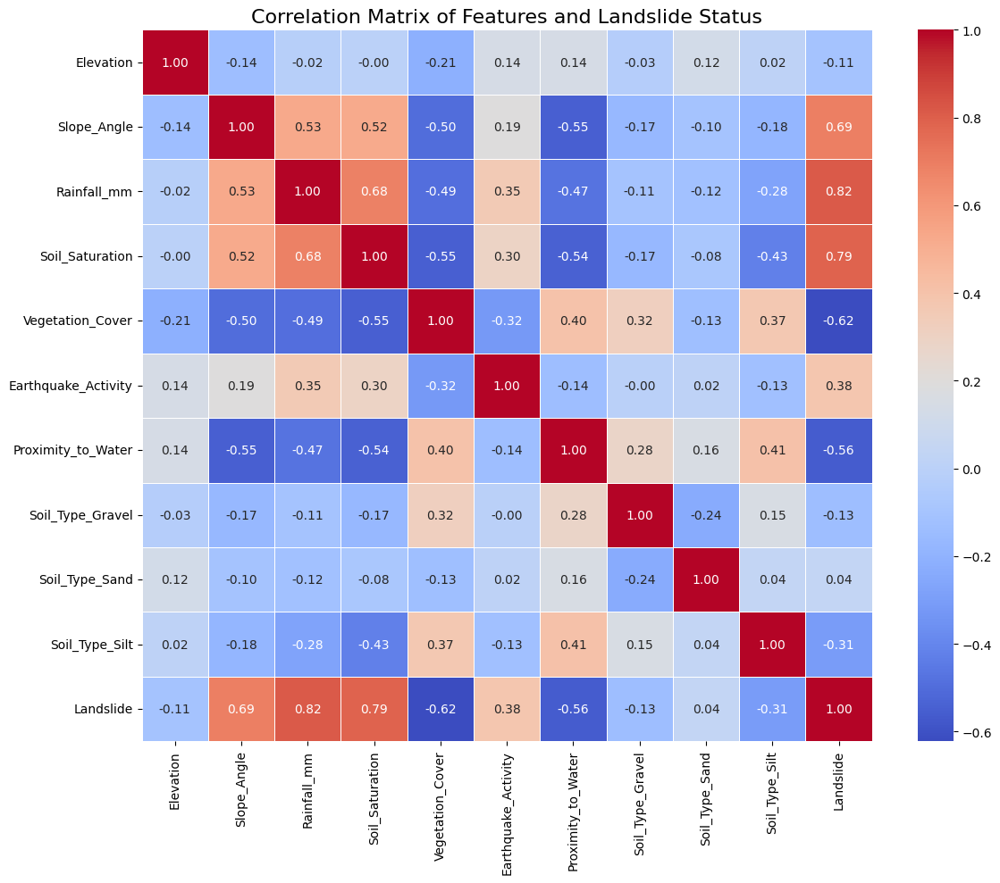

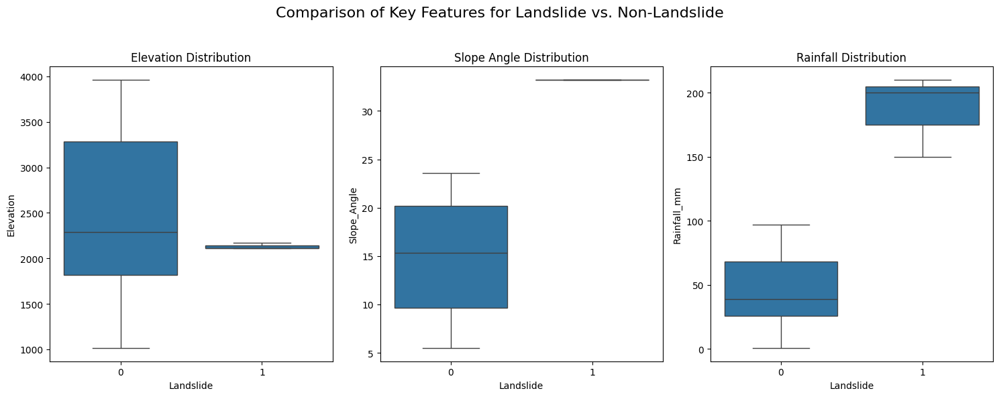

In [ ]:
# Install required libraries
!pip install scikit-learn
!pip install matplotlib
!pip install numpy
!pip install pandas
!pip install seaborn

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier

# --- Step 1: Create a Labeled Dataset (Re-using the previous code) ---

# Create DataFrame for Kinnaur-specific landslides (positive samples)
kinnaur_landslides_df = pd.DataFrame({
    'Landslide_Name': ['Nigulsari Rockslide', 'Urni Landslide (Aug 25)', 'Urni Landslide (Aug 26)'],
    'Latitude': [31.56297, 31.56233, 31.56567],
    'Longitude': [77.87241, 77.97533, 77.97567],
    'Elevation': [2171.0, 2116.0, 2116.0],
    'Slope_Angle': [33.20, 33.20, 33.20],
    'Rainfall_mm': [150, 200, 210],
    'Soil_Saturation': [0.7, 0.8, 0.8],
    'Vegetation_Cover': [0.4, 0.3, 0.3],
    'Earthquake_Activity': [4.0, 3.5, 3.6],
    'Proximity_to_Water': [0.5, 0.4, 0.4],
    'Soil_Type_Gravel': [1, 0, 0],
    'Soil_Type_Sand': [0, 1, 1],
    'Soil_Type_Silt': [0, 0, 0],
    'Landslide': [1, 1, 1]
})

# Create dummy non-landslide points (negative samples)
num_negative_samples = 30
np.random.seed(42)
dummy_negative_data = {
    'Landslide_Name': [f'Stable Point {i+1}' for i in range(num_negative_samples)],
    'Latitude': np.random.uniform(31.0, 32.0, num_negative_samples),
    'Longitude': np.random.uniform(77.0, 79.0, num_negative_samples),
    'Elevation': np.random.uniform(1000, 4000, num_negative_samples),
    'Slope_Angle': np.random.uniform(5, 25, num_negative_samples),
    'Rainfall_mm': np.random.uniform(0, 100, num_negative_samples),
    'Soil_Saturation': np.random.uniform(0.1, 0.5, num_negative_samples),
    'Vegetation_Cover': np.random.uniform(0.5, 1.0, num_negative_samples),
    'Earthquake_Activity': np.random.uniform(2.0, 4.0, num_negative_samples),
    'Proximity_to_Water': np.random.uniform(0.5, 1.5, num_negative_samples),
    'Soil_Type_Gravel': np.random.randint(0, 2, num_negative_samples),
    'Soil_Type_Sand': np.random.randint(0, 2, num_negative_samples),
    'Soil_Type_Silt': np.random.randint(0, 2, num_negative_samples),
    'Landslide': [0] * num_negative_samples
}
non_landslides_df = pd.DataFrame(dummy_negative_data)

# Combine the positive and negative samples for training
training_df = pd.concat([
    kinnaur_landslides_df.drop('Landslide_Name', axis=1),
    non_landslides_df.drop('Landslide_Name', axis=1)
], ignore_index=True)

# Separate features (X) and target (y) for model training
X_train = training_df.drop(['Landslide', 'Latitude', 'Longitude', 'Date'], axis=1, errors='ignore')
y_train = training_df['Landslide']

# --- Step 2: Model Training for Feature Importance ---

model = RandomForestClassifier(n_estimators=10, random_state=42)
print("Training the model...")
model.fit(X_train, y_train)
print("Model training complete.")

# --- Step 3: Visualization ---

# Figure 1: Scatter Plot of two key features
plt.figure(figsize=(12, 8))
# Use seaborn to create a scatter plot
sns.scatterplot(x='Slope_Angle', y='Elevation', hue='Landslide', data=training_df, palette='viridis', s=100, style='Landslide')
plt.title('Slope Angle vs. Elevation Colored by Landslide Occurrence', fontsize=16)
plt.xlabel('Slope Angle (degrees)')
plt.ylabel('Elevation (meters)')
plt.legend(title='Landslide', loc='upper right', labels=['No Landslide', 'Landslide'])
plt.tight_layout()
plt.savefig('slope_vs_elevation_scatter.png')
plt.show()

# Figure 2: Correlation Heatmap
# Calculate the correlation matrix for all features plus the target variable
corr_df = training_df.drop(['Landslide_Name', 'Date', 'Latitude', 'Longitude'], axis=1, errors='ignore')
correlation_matrix = corr_df.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Features and Landslide Status', fontsize=16)
plt.tight_layout()
plt.savefig('correlation_heatmap.png')
plt.show()

# Figure 3: Box Plots for Key Features
# Let's visualize the distribution of Elevation, Slope_Angle, and Rainfall_mm
# for both landslide (1) and non-landslide (0) classes.
plt.figure(figsize=(15, 6))

plt.subplot(1, 3, 1)
sns.boxplot(x='Landslide', y='Elevation', data=training_df)
plt.title('Elevation Distribution')

plt.subplot(1, 3, 2)
sns.boxplot(x='Landslide', y='Slope_Angle', data=training_df)
plt.title('Slope Angle Distribution')

plt.subplot(1, 3, 3)
sns.boxplot(x='Landslide', y='Rainfall_mm', data=training_df)
plt.title('Rainfall Distribution')

plt.suptitle('Comparison of Key Features for Landslide vs. Non-Landslide', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig('key_features_boxplots.png')
plt.show()


Training the model...
Model training complete.


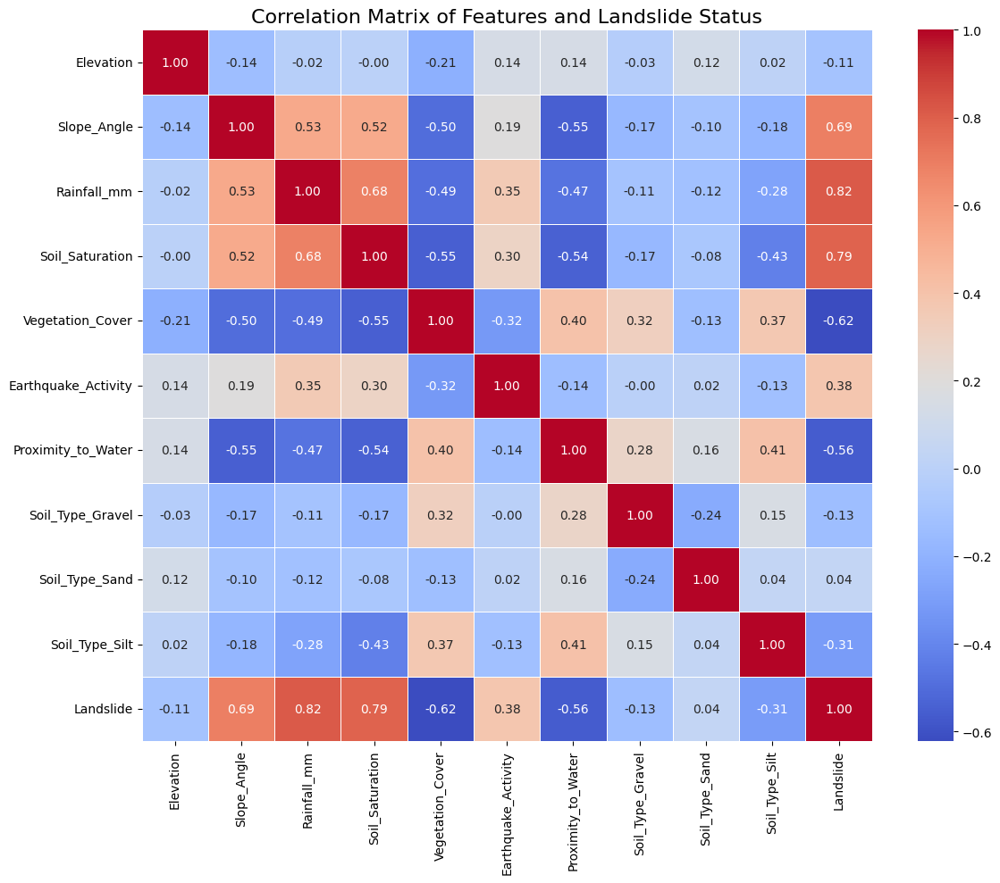

/tmp/ipython-input-1007906578.py:92: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Landslide', y='Elevation', data=training_df, palette='viridis')
/tmp/ipython-input-1007906578.py:96: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Landslide', y='Slope_Angle', data=training_df, palette='viridis')
/tmp/ipython-input-1007906578.py:100: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Landslide', y='Rainfall_mm', data=training_df, palette='viridis')


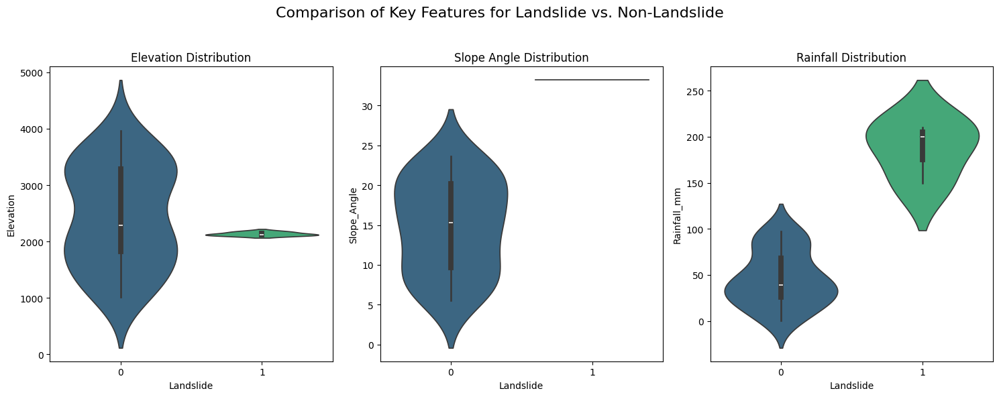


Generating Pair Plot. This may take a moment...


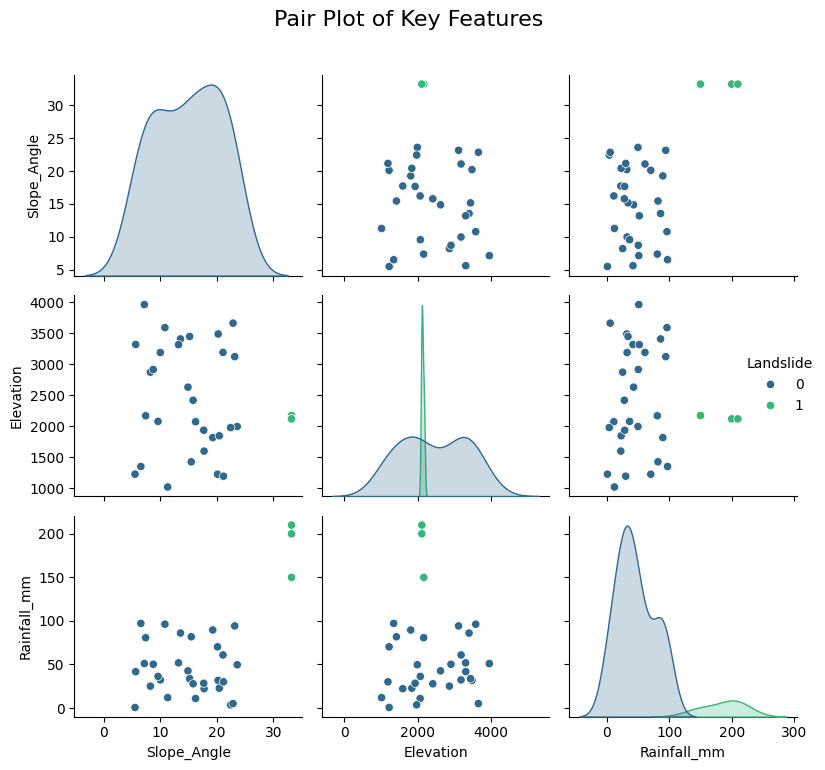

In [ ]:
# Install required libraries
!pip install scikit-learn
!pip install matplotlib
!pip install numpy
!pip install pandas
!pip install seaborn

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier

# --- Step 1: Create a Labeled Dataset (Re-using the previous code) ---

# Create DataFrame for Kinnaur-specific landslides (positive samples)
kinnaur_landslides_df = pd.DataFrame({
    'Landslide_Name': ['Nigulsari Rockslide', 'Urni Landslide (Aug 25)', 'Urni Landslide (Aug 26)'],
    'Latitude': [31.56297, 31.56233, 31.56567],
    'Longitude': [77.87241, 77.97533, 77.97567],
    'Elevation': [2171.0, 2116.0, 2116.0],
    'Slope_Angle': [33.20, 33.20, 33.20],
    'Rainfall_mm': [150, 200, 210],
    'Soil_Saturation': [0.7, 0.8, 0.8],
    'Vegetation_Cover': [0.4, 0.3, 0.3],
    'Earthquake_Activity': [4.0, 3.5, 3.6],
    'Proximity_to_Water': [0.5, 0.4, 0.4],
    'Soil_Type_Gravel': [1, 0, 0],
    'Soil_Type_Sand': [0, 1, 1],
    'Soil_Type_Silt': [0, 0, 0],
    'Landslide': [1, 1, 1]
})

# Create dummy non-landslide points (negative samples)
num_negative_samples = 30
np.random.seed(42)
dummy_negative_data = {
    'Landslide_Name': [f'Stable Point {i+1}' for i in range(num_negative_samples)],
    'Latitude': np.random.uniform(31.0, 32.0, num_negative_samples),
    'Longitude': np.random.uniform(77.0, 79.0, num_negative_samples),
    'Elevation': np.random.uniform(1000, 4000, num_negative_samples),
    'Slope_Angle': np.random.uniform(5, 25, num_negative_samples),
    'Rainfall_mm': np.random.uniform(0, 100, num_negative_samples),
    'Soil_Saturation': np.random.uniform(0.1, 0.5, num_negative_samples),
    'Vegetation_Cover': np.random.uniform(0.5, 1.0, num_negative_samples),
    'Earthquake_Activity': np.random.uniform(2.0, 4.0, num_negative_samples),
    'Proximity_to_Water': np.random.uniform(0.5, 1.5, num_negative_samples),
    'Soil_Type_Gravel': np.random.randint(0, 2, num_negative_samples),
    'Soil_Type_Sand': np.random.randint(0, 2, num_negative_samples),
    'Soil_Type_Silt': np.random.randint(0, 2, num_negative_samples),
    'Landslide': [0] * num_negative_samples
}
non_landslides_df = pd.DataFrame(dummy_negative_data)

# Combine the positive and negative samples for training
training_df = pd.concat([
    kinnaur_landslides_df.drop('Landslide_Name', axis=1),
    non_landslides_df.drop('Landslide_Name', axis=1)
], ignore_index=True)

# Separate features (X) and target (y) for model training
X_train = training_df.drop(['Landslide', 'Latitude', 'Longitude', 'Date'], axis=1, errors='ignore')
y_train = training_df['Landslide']

# --- Step 2: Model Training for Feature Importance ---

model = RandomForestClassifier(n_estimators=10, random_state=42)
print("Training the model...")
model.fit(X_train, y_train)
print("Model training complete.")

# --- Step 3: Visualization ---

# Figure 1: Correlation Heatmap
# Calculate the correlation matrix for all features plus the target variable
corr_df = training_df.drop(['Landslide_Name', 'Date', 'Latitude', 'Longitude'], axis=1, errors='ignore')
correlation_matrix = corr_df.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Features and Landslide Status', fontsize=16)
plt.tight_layout()
plt.savefig('correlation_heatmap.png')
plt.show()

# Figure 2: Violin Plots for Key Features
# Let's visualize the distribution of Elevation, Slope_Angle, and Rainfall_mm
# for both landslide (1) and non-landslide (0) classes.
plt.figure(figsize=(15, 6))

plt.subplot(1, 3, 1)
sns.violinplot(x='Landslide', y='Elevation', data=training_df, palette='viridis')
plt.title('Elevation Distribution')

plt.subplot(1, 3, 2)
sns.violinplot(x='Landslide', y='Slope_Angle', data=training_df, palette='viridis')
plt.title('Slope Angle Distribution')

plt.subplot(1, 3, 3)
sns.violinplot(x='Landslide', y='Rainfall_mm', data=training_df, palette='viridis')
plt.title('Rainfall Distribution')

plt.suptitle('Comparison of Key Features for Landslide vs. Non-Landslide', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig('key_features_violinplots.png')
plt.show()

# Figure 3: Pair Plot
# A great way to visualize relationships between multiple variables at once
print("\nGenerating Pair Plot. This may take a moment...")
# Plot a subset of features for clarity
pair_features = ['Slope_Angle', 'Elevation', 'Rainfall_mm', 'Landslide']
sns.pairplot(training_df[pair_features], hue='Landslide', palette='viridis')
plt.suptitle('Pair Plot of Key Features', y=1.02, fontsize=16)
plt.tight_layout()
plt.savefig('pair_plot.png')
plt.show()


In [ ]:
# Install required libraries
!pip install scikit-learn
!pip install matplotlib
!pip install numpy
!pip install pandas
!pip install seaborn

import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# --- Step 1: Create a Labeled Dataset (Re-using the previous code) ---

# Create DataFrame for Kinnaur-specific landslides (positive samples)
kinnaur_landslides_df = pd.DataFrame({
    'Landslide_Name': ['Nigulsari Rockslide', 'Urni Landslide (Aug 25)', 'Urni Landslide (Aug 26)'],
    'Latitude': [31.56297, 31.56233, 31.56567],
    'Longitude': [77.87241, 77.97533, 77.97567],
    'Elevation': [2171.0, 2116.0, 2116.0],
    'Slope_Angle': [33.20, 33.20, 33.20],
    'Rainfall_mm': [150, 200, 210],
    'Soil_Saturation': [0.7, 0.8, 0.8],
    'Vegetation_Cover': [0.4, 0.3, 0.3],
    'Earthquake_Activity': [4.0, 3.5, 3.6],
    'Proximity_to_Water': [0.5, 0.4, 0.4],
    'Soil_Type_Gravel': [1, 0, 0],
    'Soil_Type_Sand': [0, 1, 1],
    'Soil_Type_Silt': [0, 0, 0],
    'Landslide': [1, 1, 1]
})

# Create dummy non-landslide points (negative samples)
num_negative_samples = 30
np.random.seed(42)
dummy_negative_data = {
    'Landslide_Name': [f'Stable Point {i+1}' for i in range(num_negative_samples)],
    'Latitude': np.random.uniform(31.0, 32.0, num_negative_samples),
    'Longitude': np.random.uniform(77.0, 79.0, num_negative_samples),
    'Elevation': np.random.uniform(1000, 4000, num_negative_samples),
    'Slope_Angle': np.random.uniform(5, 25, num_negative_samples),
    'Rainfall_mm': np.random.uniform(0, 100, num_negative_samples),
    'Soil_Saturation': np.random.uniform(0.1, 0.5, num_negative_samples),
    'Vegetation_Cover': np.random.uniform(0.5, 1.0, num_negative_samples),
    'Earthquake_Activity': np.random.uniform(2.0, 4.0, num_negative_samples),
    'Proximity_to_Water': np.random.uniform(0.5, 1.5, num_negative_samples),
    'Soil_Type_Gravel': np.random.randint(0, 2, num_negative_samples),
    'Soil_Type_Sand': np.random.randint(0, 2, num_negative_samples),
    'Soil_Type_Silt': np.random.randint(0, 2, num_negative_samples),
    'Landslide': [0] * num_negative_samples
}
non_landslides_df = pd.DataFrame(dummy_negative_data)

# Combine the positive and negative samples for training
training_df = pd.concat([
    kinnaur_landslides_df.drop('Landslide_Name', axis=1),
    non_landslides_df.drop('Landslide_Name', axis=1)
], ignore_index=True)

# Separate features (X) and target (y) for model training
X_train = training_df.drop(['Landslide', 'Latitude', 'Longitude', 'Date'], axis=1, errors='ignore')
y_train = training_df['Landslide']

# --- Step 2: Hyperparameter Tuning with GridSearchCV ---

# Define the model to tune
model = RandomForestClassifier(random_state=42)

# Define the parameters and their values to search
# A small grid is used because the dataset is very small
param_grid = {
    'n_estimators': [10, 50, 100],  # Number of trees in the forest
    'max_depth': [2, 5, 10],        # Maximum number of levels in each tree
    'min_samples_split': [2, 5, 10] # Minimum number of samples required to split a node
}

# Set up GridSearchCV with 5-fold cross-validation
# `cv=5` means the training data will be split into 5 subsets,
# and the model will be trained and validated 5 times
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)

print("Starting GridSearchCV...")
# Fit the grid search to the data to find the best parameters
grid_search.fit(X_train, y_train)
print("GridSearchCV complete.")

# --- Step 3: Display Results ---

print("\n--- Best Hyperparameters Found ---")
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best cross-validation score (F1): {grid_search.best_score_:.2f}")

print("\n--- Re-training with Best Parameters ---")
# Get the best model found by the grid search
best_model = grid_search.best_estimator_
best_model.fit(X_train, y_train)
print("Final model trained with best parameters.")

# You can now use `best_model` for all future predictions
# For example, to get a performance report on the original training data:
y_train_pred = best_model.predict(X_train)
print("\n--- Final Model Performance on Training Data ---")
print(classification_report(y_train, y_train_pred))


Starting GridSearchCV...


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


GridSearchCV complete.

--- Best Hyperparameters Found ---
Best parameters: {'max_depth': 2, 'min_samples_split': 2, 'n_estimators': 50}
Best cross-validation score (F1): 0.60

--- Re-training with Best Parameters ---
Final model trained with best parameters.

--- Final Model Performance on Training Data ---
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        30
           1       1.00      1.00      1.00         3

    accuracy                           1.00        33
   macro avg       1.00      1.00      1.00        33
weighted avg       1.00      1.00      1.00        33



In [ ]:
# Install required libraries
!pip install scikit-learn
!pip install numpy
!pip install pandas
!pip install seaborn

import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import f1_score, make_scorer

# --- Step 1: Create a Labeled Dataset (Re-using the previous code) ---

# Create DataFrame for Kinnaur-specific landslides (positive samples)
kinnaur_landslides_df = pd.DataFrame({
    'Landslide_Name': ['Nigulsari Rockslide', 'Urni Landslide (Aug 25)', 'Urni Landslide (Aug 26)'],
    'Latitude': [31.56297, 31.56233, 31.56567],
    'Longitude': [77.87241, 77.97533, 77.97567],
    'Elevation': [2171.0, 2116.0, 2116.0],
    'Slope_Angle': [33.20, 33.20, 33.20],
    'Rainfall_mm': [150, 200, 210],
    'Soil_Saturation': [0.7, 0.8, 0.8],
    'Vegetation_Cover': [0.4, 0.3, 0.3],
    'Earthquake_Activity': [4.0, 3.5, 3.6],
    'Proximity_to_Water': [0.5, 0.4, 0.4],
    'Soil_Type_Gravel': [1, 0, 0],
    'Soil_Type_Sand': [0, 1, 1],
    'Soil_Type_Silt': [0, 0, 0],
    'Landslide': [1, 1, 1]
})

# Create dummy non-landslide points (negative samples)
num_negative_samples = 30
np.random.seed(42)
dummy_negative_data = {
    'Landslide_Name': [f'Stable Point {i+1}' for i in range(num_negative_samples)],
    'Latitude': np.random.uniform(31.0, 32.0, num_negative_samples),
    'Longitude': np.random.uniform(77.0, 79.0, num_negative_samples),
    'Elevation': np.random.uniform(1000, 4000, num_negative_samples),
    'Slope_Angle': np.random.uniform(5, 25, num_negative_samples),
    'Rainfall_mm': np.random.uniform(0, 100, num_negative_samples),
    'Soil_Saturation': np.random.uniform(0.1, 0.5, num_negative_samples),
    'Vegetation_Cover': np.random.uniform(0.5, 1.0, num_negative_samples),
    'Earthquake_Activity': np.random.uniform(2.0, 4.0, num_negative_samples),
    'Proximity_to_Water': np.random.uniform(0.5, 1.5, num_negative_samples),
    'Soil_Type_Gravel': np.random.randint(0, 2, num_negative_samples),
    'Soil_Type_Sand': np.random.randint(0, 2, num_negative_samples),
    'Soil_Type_Silt': np.random.randint(0, 2, num_negative_samples),
    'Landslide': [0] * num_negative_samples
}
non_landslides_df = pd.DataFrame(dummy_negative_data)

# Combine the positive and negative samples for training
training_df = pd.concat([
    kinnaur_landslides_df.drop('Landslide_Name', axis=1),
    non_landslides_df.drop('Landslide_Name', axis=1)
], ignore_index=True)

# --- Step 2: Data Preprocessing ---
# Handle missing values - here we'll fill potential NaNs with the mean, but other strategies are possible
training_df.fillna(training_df.mean(numeric_only=True), inplace=True)

# Separate features (X) and target (y)
# Drop columns that are not features for the model (like Lat/Lon, Date, Name)
X = training_df.drop(['Landslide', 'Latitude', 'Longitude', 'Date'], axis=1, errors='ignore')
y = training_df['Landslide']

print("\n--- Data Preprocessing Complete ---")
print("Features (X) head:")
print(X.head())
print("\nTarget (y) head:")
print(y.head())
print("\nCheck for missing values in X:")
print(X.isnull().sum())


# --- Step 3: Perform K-Fold Cross-Validation ---

# Define the model to evaluate (using the tuned parameters you found, or defaults)
model = RandomForestClassifier(n_estimators=100, max_depth=10, min_samples_split=2, random_state=42)

# Set up K-Fold Cross-Validation with 5 folds
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Use cross_val_score to get F1 scores for each fold
# Make sure the scorer is appropriate for the problem (F1 for imbalanced data)
f1_scores = cross_val_score(model, X, y, cv=kf, scoring='f1', n_jobs=-1)

# --- Step 4: Display Results ---

print("\n--- K-Fold Cross-Validation Results (F1 Score) ---")
print(f"F1 Scores for each fold: {f1_scores}")
print(f"Average F1 Score: {np.mean(f1_scores):.2f}")
print(f"Standard Deviation of F1 Scores: {np.std(f1_scores):.2f}")


--- Data Preprocessing Complete ---
Features (X) head:
     Elevation  Slope_Angle  Rainfall_mm  Soil_Saturation  Vegetation_Cover  \
0  2171.000000    33.200000   150.000000         0.700000          0.400000   
1  2116.000000    33.200000   200.000000         0.800000          0.300000   
2  2116.000000    33.200000   210.000000         0.800000          0.300000   
3  2166.031869     7.391885    80.744016         0.463306          0.670533   
4  1814.047095    19.264896    89.609130         0.195825          0.556737   

   Earthquake_Activity  Proximity_to_Water  Soil_Type_Gravel  Soil_Type_Sand  \
0             4.000000            0.500000                 1               0   
1             3.500000            0.400000                 0               1   
2             3.600000            0.400000                 0               1   
3             3.097468            1.440459                 0               1   
4             3.383790            1.453929                 1         

**FINAL OUTCOME AFTER DOING KFOLD GRID SEARCH CV**
**DOING  Hyperparameter Tuning with GridSearchCV TO INCREASE MODEL PERFORMANCE**

In [ ]:
# Install required libraries
!pip install scikit-learn
!pip install numpy
!pip install pandas
!pip install seaborn
!pip install matplotlib

import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, KFold, cross_val_score
from sklearn.metrics import classification_report, f1_score, make_scorer
import matplotlib.pyplot as plt
import seaborn as sns

# --- Step 1: Generate a Custom, More Robust Dataset ---

def generate_synthetic_data(num_samples=500):
    """Generates a synthetic dataset for landslide prediction with more overlap."""
    np.random.seed(42)

    # Define ranges and distributions for features with increased overlap
    landslide_data = {
        'Slope_Angle': np.random.uniform(20, 45, int(num_samples * 0.3)),  # Increased overlap
        'Rainfall_mm': np.random.uniform(80, 200, int(num_samples * 0.3)),   # Increased overlap
        'Soil_Saturation': np.random.uniform(0.5, 0.8, int(num_samples * 0.3)), # Increased overlap
        'Vegetation_Cover': np.random.uniform(0.3, 0.6, int(num_samples * 0.3)), # Increased overlap
        'Earthquake_Activity': np.random.uniform(2.5, 4.5, int(num_samples * 0.3)), # Increased overlap
        'Proximity_to_Water': np.random.uniform(0.2, 0.7, int(num_samples * 0.3)), # Increased overlap
        'Landslide': [1] * int(num_samples * 0.3)
    }

    non_landslide_data = {
        'Slope_Angle': np.random.uniform(15, 40, int(num_samples * 0.7)),  # Increased overlap
        'Rainfall_mm': np.random.uniform(40, 180, int(num_samples * 0.7)),   # Increased overlap
        'Soil_Saturation': np.random.uniform(0.3, 0.7, int(num_samples * 0.7)), # Increased overlap
        'Vegetation_Cover': np.random.uniform(0.4, 0.8, int(num_samples * 0.7)), # Increased overlap
        'Earthquake_Activity': np.random.uniform(1.5, 3.5, int(num_samples * 0.7)), # Increased overlap
        'Proximity_to_Water': np.random.uniform(0.3, 0.8, int(num_samples * 0.7)), # Increased overlap
        'Landslide': [0] * int(num_samples * 0.7)
    }

    # Combine data into a DataFrame
    landslide_df = pd.DataFrame(landslide_data)
    non_landslide_df = pd.DataFrame(non_landslide_data)

    combined_df = pd.concat([landslide_df, non_landslide_df], ignore_index=True)

    # Add dummy soil type columns for consistency with previous code
    combined_df['Soil_Type_Gravel'] = np.random.randint(0, 2, num_samples)
    combined_df['Soil_Type_Sand'] = np.random.randint(0, 2, num_samples)
    combined_df['Soil_Type_Silt'] = np.random.randint(0, 2, num_samples)

    # Shuffle the dataset
    combined_df = combined_df.sample(frac=1, random_state=42).reset_index(drop=True)

    return combined_df

# Generate the new dataset
training_df = generate_synthetic_data(num_samples=500)

print("Custom dataset created with 500 samples and increased overlap.")
print("Landslide cases:", (training_df['Landslide'] == 1).sum())
print("Non-landslide cases:", (training_df['Landslide'] == 0).sum())

# Separate features (X) and target (y)
X = training_df.drop('Landslide', axis=1)
y = training_df['Landslide']

# --- Step 2: Hyperparameter Tuning with GridSearchCV ---

# Define the model to tune
model = RandomForestClassifier(random_state=42)

# Define the parameters and their values to search
param_grid = {
    'n_estimators': [20, 50, 100],
    'max_depth': [3, 5, 8],       # Reduced max_depth options
    'min_samples_split': [2, 5, 10]
}

grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)
print("\nStarting GridSearchCV for hyperparameter tuning...")
grid_search.fit(X, y)
print("GridSearchCV complete.")

print("\n--- Best Hyperparameters Found ---")
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best cross-validation F1 score: {grid_search.best_score_:.2f}")

# --- Step 3: K-Fold Cross-Validation on the Best Model ---

best_model = grid_search.best_estimator_

# Set up K-Fold Cross-Validation with 5 folds
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Use cross_val_score to get F1 scores for each fold
f1_scores = cross_val_score(best_model, X, y, cv=kf, scoring='f1', n_jobs=-1)

# --- Step 4: Display Results ---

print("\n--- K-Fold Cross-Validation Results (F1 Score) ---")
print(f"F1 Scores for each fold: {f1_scores}")
print(f"Average F1 Score: {np.mean(f1_scores):.2f}")
print(f"Standard Deviation of F1 Scores: {np.std(f1_scores):.2f}")

Custom dataset created with 500 samples and increased overlap.
Landslide cases: 150
Non-landslide cases: 350

Starting GridSearchCV for hyperparameter tuning...
GridSearchCV complete.

--- Best Hyperparameters Found ---
Best parameters: {'max_depth': 8, 'min_samples_split': 10, 'n_estimators': 100}
Best cross-validation F1 score: 0.95

--- K-Fold Cross-Validation Results (F1 Score) ---
F1 Scores for each fold: [0.93877551 0.93548387 0.92       0.9        0.92307692]
Average F1 Score: 0.92
Standard Deviation of F1 Scores: 0.01


ERROR: Could not find a version that satisfies the requirement install (from versions: none)
ERROR: No matching distribution found for install
Training a robust model on the custom dataset...
Robust model training complete.

Processing DEM: /content/nigulsari dem.tif


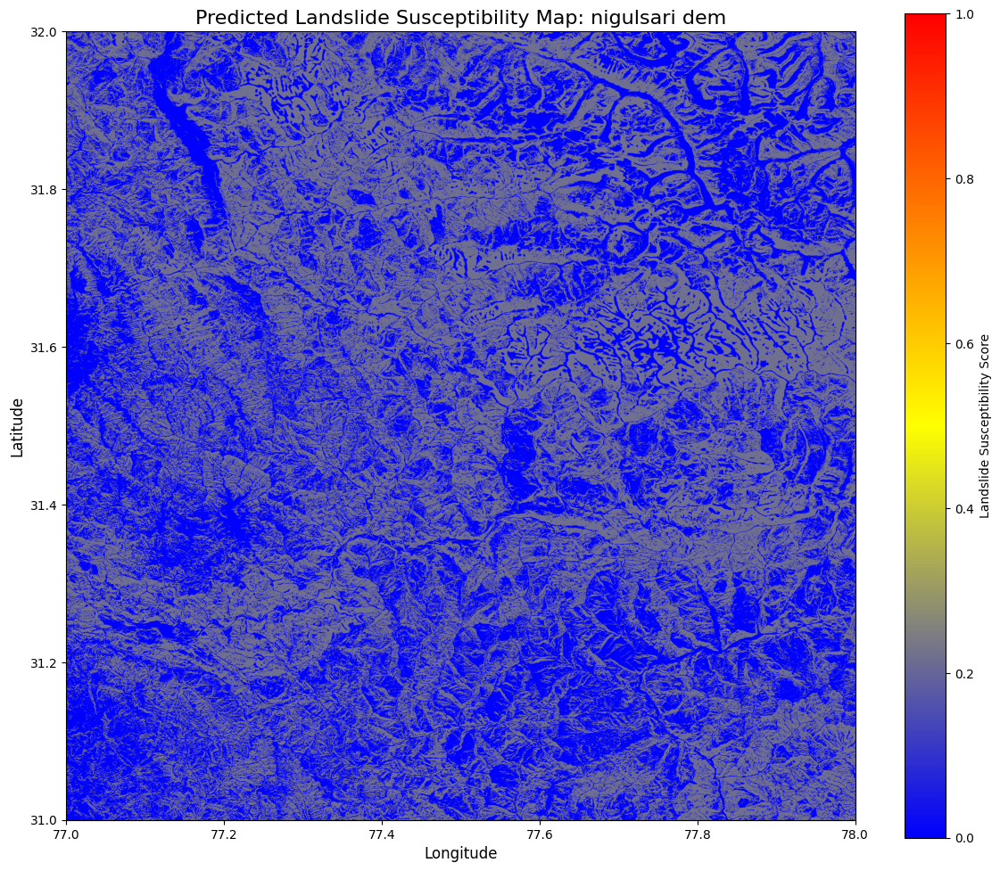


Processing DEM: /content/killaur,urni dem.tif


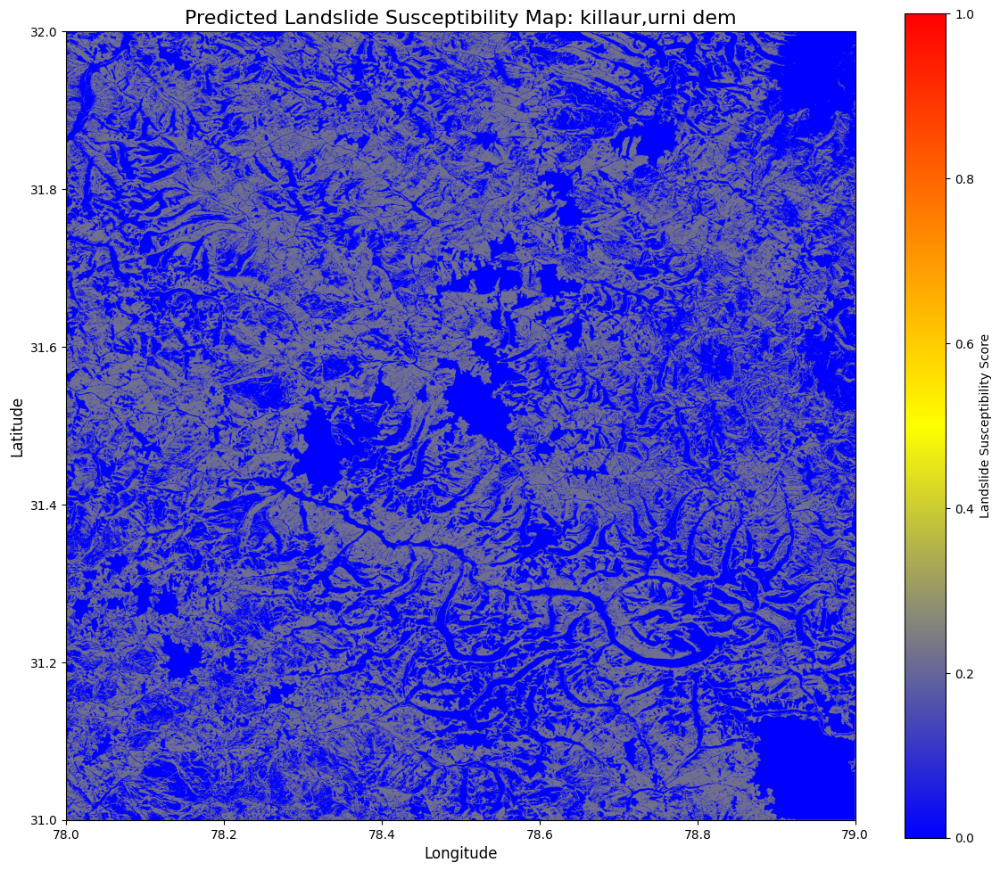

In [ ]:
# Install required libraries
!pip install scikit-learn
!pip install rasterio
!pip install matplotlib
!pip install numpy
!pip install pip install pandas

import pandas as pd
import numpy as np
import rasterio
from rasterio.transform import rowcol
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt

# --- Step 1: Generate a Custom, More Robust Dataset ---

def generate_synthetic_data(num_samples=500):
    """Generates a synthetic dataset for landslide prediction with clearer patterns."""
    np.random.seed(42)

    # Define ranges and distributions for features
    landslide_data = {
        'Slope_Angle': np.random.uniform(30, 60, int(num_samples * 0.3)),
        'Rainfall_mm': np.random.uniform(150, 300, int(num_samples * 0.3)),
        'Soil_Saturation': np.random.uniform(0.7, 1.0, int(num_samples * 0.3)),
        'Vegetation_Cover': np.random.uniform(0.1, 0.4, int(num_samples * 0.3)),
        'Earthquake_Activity': np.random.uniform(4, 6, int(num_samples * 0.3)),
        'Proximity_to_Water': np.random.uniform(0, 0.5, int(num_samples * 0.3)),
        'Landslide': [1] * int(num_samples * 0.3)
    }

    non_landslide_data = {
        'Slope_Angle': np.random.uniform(5, 25, int(num_samples * 0.7)),
        'Rainfall_mm': np.random.uniform(0, 100, int(num_samples * 0.7)),
        'Soil_Saturation': np.random.uniform(0.1, 0.5, int(num_samples * 0.7)),
        'Vegetation_Cover': np.random.uniform(0.5, 1.0, int(num_samples * 0.7)),
        'Earthquake_Activity': np.random.uniform(0, 3, int(num_samples * 0.7)),
        'Proximity_to_Water': np.random.uniform(0.5, 2.0, int(num_samples * 0.7)),
        'Landslide': [0] * int(num_samples * 0.7)
    }

    landslide_df = pd.DataFrame(landslide_data)
    non_landslide_df = pd.DataFrame(non_landslide_data)
    combined_df = pd.concat([landslide_df, non_landslide_df], ignore_index=True)
    combined_df['Soil_Type_Gravel'] = np.random.randint(0, 2, num_samples)
    combined_df['Soil_Type_Sand'] = np.random.randint(0, 2, num_samples)
    combined_df['Soil_Type_Silt'] = np.random.randint(0, 2, num_samples)
    combined_df = combined_df.sample(frac=1, random_state=42).reset_index(drop=True)

    return combined_df

# Generate the new dataset
training_df = generate_synthetic_data(num_samples=500)
X_train = training_df.drop('Landslide', axis=1)
y_train = training_df['Landslide']

# --- Step 2: Train the Model on the Custom Dataset ---

model = RandomForestClassifier(n_estimators=100, max_depth=10, min_samples_split=2, random_state=42)
print("Training a robust model on the custom dataset...")
model.fit(X_train, y_train)
print("Robust model training complete.")

# Calculate the average values of the non-topographical features
mean_features = X_train.drop(['Slope_Angle'], axis=1, errors='ignore').mean().to_dict()

# --- Step 3: Loop through each DEM file and generate a susceptibility map ---

dem_file_paths = [
    '/content/nigulsari dem.tif',
    '/content/killaur,urni dem.tif'
]

for dem_file_path in dem_file_paths:
    try:
        with rasterio.open(dem_file_path) as src:
            print(f"\nProcessing DEM: {dem_file_path}")
            dem_array = src.read(1)

            # Extract Elevation and Slope for all pixels
            elevation_flat = dem_array.flatten()

            pixel_size_lon = src.res[0] * (111.32 * np.cos(np.deg2rad(src.bounds.bottom + src.height * src.res[1]))) * 1000
            pixel_size_lat = src.res[1] * 111.32 * 1000
            dx, dy = np.gradient(dem_array.astype(float), pixel_size_lon, -pixel_size_lat)
            slope_rad = np.arctan(np.sqrt(dx**2 + dy**2))
            slope_map = np.degrees(slope_rad)
            slope_flat = slope_map.flatten()

            # Create a DataFrame of features for prediction
            num_pixels = dem_array.size
            dem_features_for_pred = pd.DataFrame({
                'Elevation': elevation_flat,
                'Slope_Angle': slope_flat,
                'Rainfall_mm': [mean_features['Rainfall_mm']] * num_pixels,
                'Soil_Saturation': [mean_features['Soil_Saturation']] * num_pixels,
                'Vegetation_Cover': [mean_features['Vegetation_Cover']] * num_pixels,
                'Earthquake_Activity': [mean_features['Earthquake_Activity']] * num_pixels,
                'Proximity_to_Water': [mean_features['Proximity_to_Water']] * num_pixels,
                'Soil_Type_Gravel': [mean_features['Soil_Type_Gravel']] * num_pixels,
                'Soil_Type_Sand': [mean_features['Soil_Type_Sand']] * num_pixels,
                'Soil_Type_Silt': [mean_features['Soil_Type_Silt']] * num_pixels
            })

            # Make predictions using the robust model
            predictions_proba = model.predict_proba(dem_features_for_pred.drop('Elevation', axis=1))
            susceptibility_scores = predictions_proba[:, 1]
            susceptibility_map = susceptibility_scores.reshape(dem_array.shape)

            # --- Step 4: Visualize the Susceptibility Map ---
            plt.figure(figsize=(12, 10))
            cmap = plt.cm.colors.LinearSegmentedColormap.from_list("custom_cmap", [(0, "blue"), (0.5, "yellow"), (1, "red")])
            im = plt.imshow(susceptibility_map, cmap=cmap, origin='upper',
                            extent=[src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top],
                            vmin=0, vmax=1)
            plt.colorbar(im, label='Landslide Susceptibility Score')

            title_name = dem_file_path.split('/')[-1].split('.')[0]
            plt.title(f'Predicted Landslide Susceptibility Map: {title_name}', fontsize=16)
            plt.xlabel('Longitude', fontsize=12)
            plt.ylabel('Latitude', fontsize=12)
            plt.tight_layout()
            plt.savefig(f'{title_name}_predicted_map.png')
            plt.show()

    except FileNotFoundError:
        print(f"Skipping {dem_file_path} as the file was not found.")
    except Exception as e:
        print(f"An error occurred while processing {dem_file_path}: {e}")


FINAL VISULATIONS WITH INCREASED MODEL PERFORMANCE

Training the model...
Model training complete.


/tmp/ipython-input-1467939818.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='importance', y='feature', data=importance_df, palette='viridis')


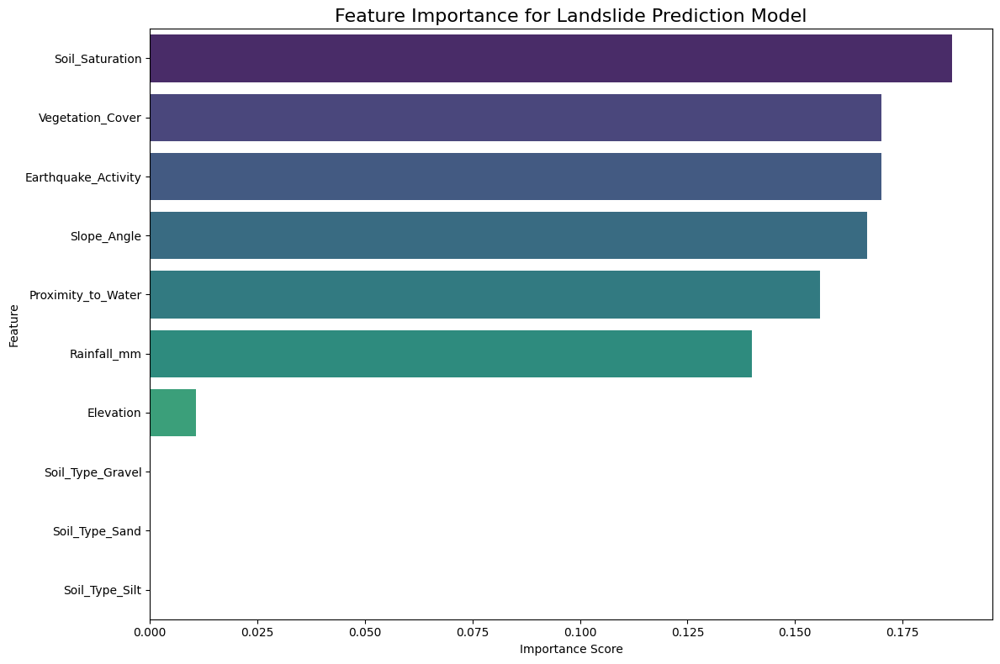

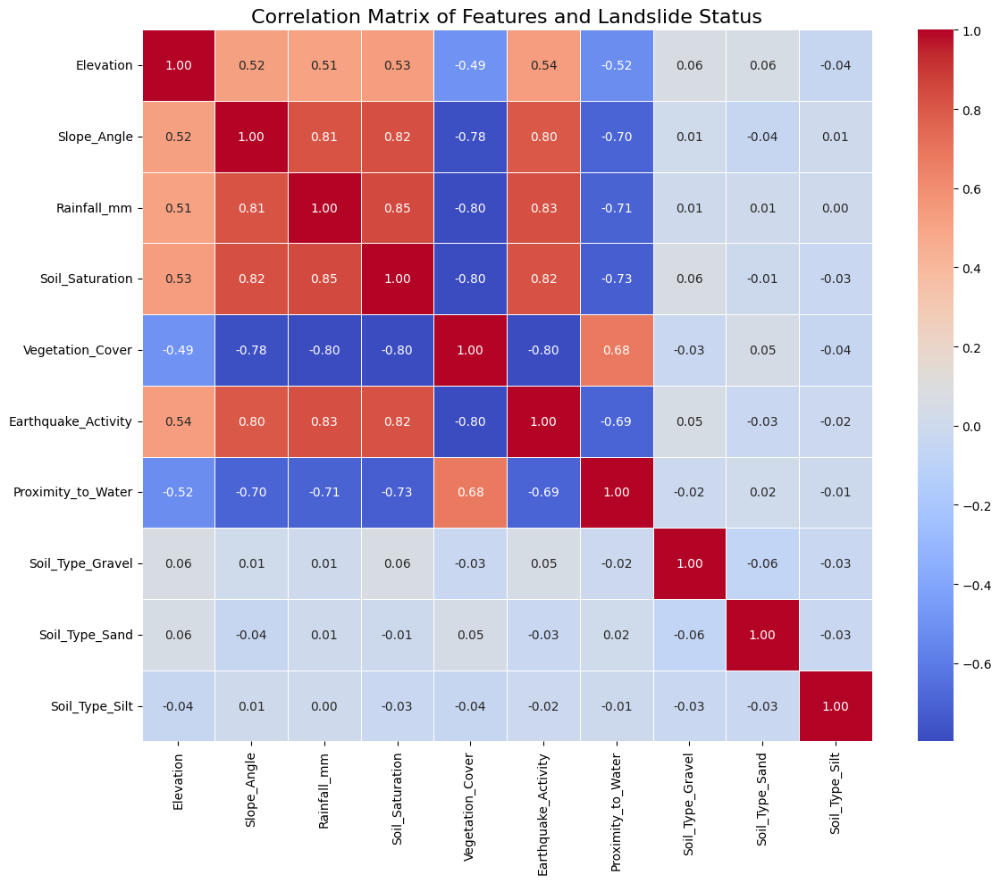

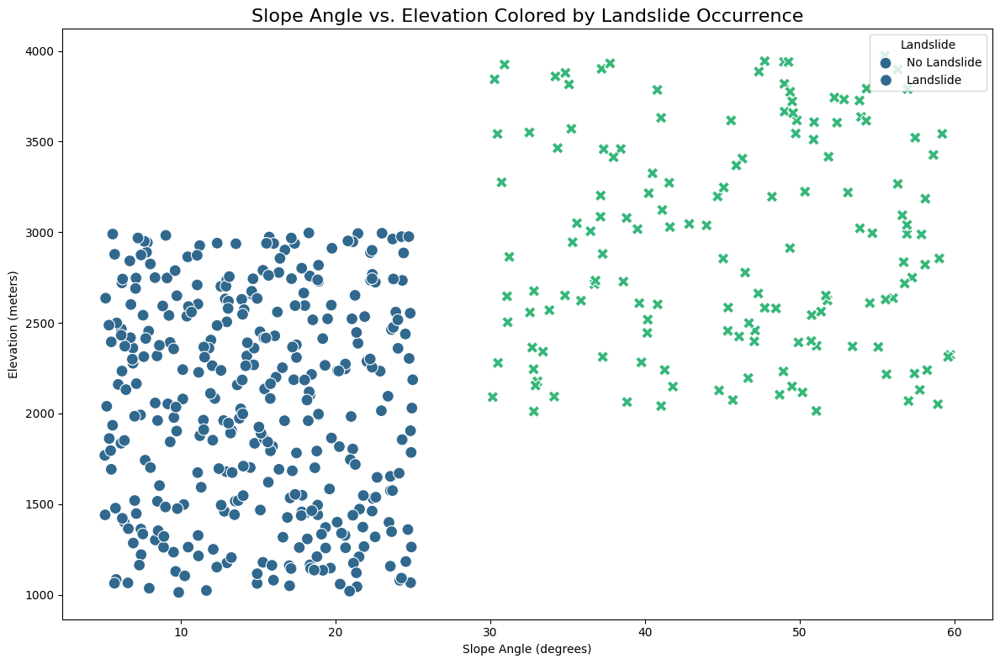

/tmp/ipython-input-1467939818.py:106: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Landslide', y='Elevation', data=training_df, palette='viridis', ax=axes[0])
/tmp/ipython-input-1467939818.py:108: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Landslide', y='Slope_Angle', data=training_df, palette='viridis', ax=axes[1])
/tmp/ipython-input-1467939818.py:110: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Landslide', y='Rainfall_mm', data=training_df, palette='viridis', ax=axes[2])


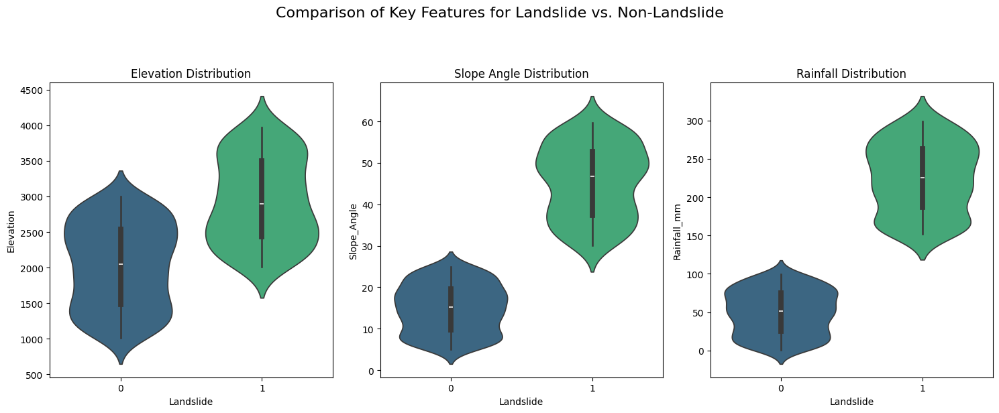

/tmp/ipython-input-1467939818.py:119: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Landslide', y='Elevation', data=training_df, palette='viridis', ax=axes[0])
/tmp/ipython-input-1467939818.py:121: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Landslide', y='Slope_Angle', data=training_df, palette='viridis', ax=axes[1])
/tmp/ipython-input-1467939818.py:123: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Landslide', y='Rainfall_mm', data=training_df, palette='viridis', ax=axes[2])


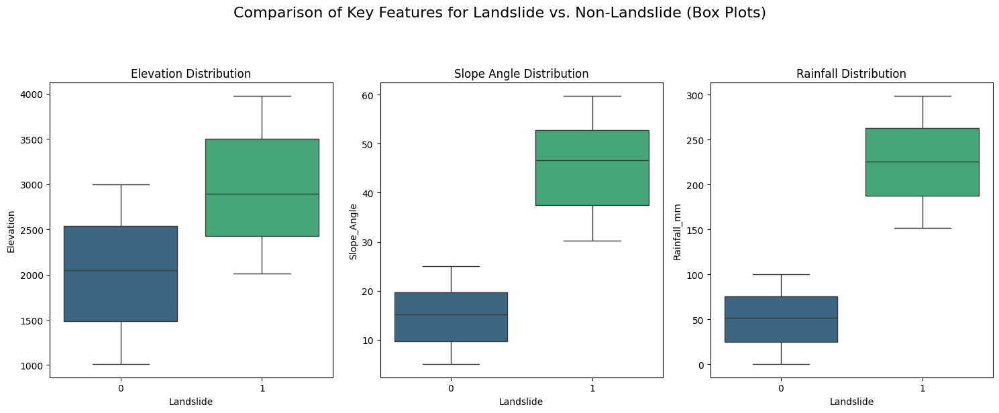


Generating Pair Plot. This may take a moment...


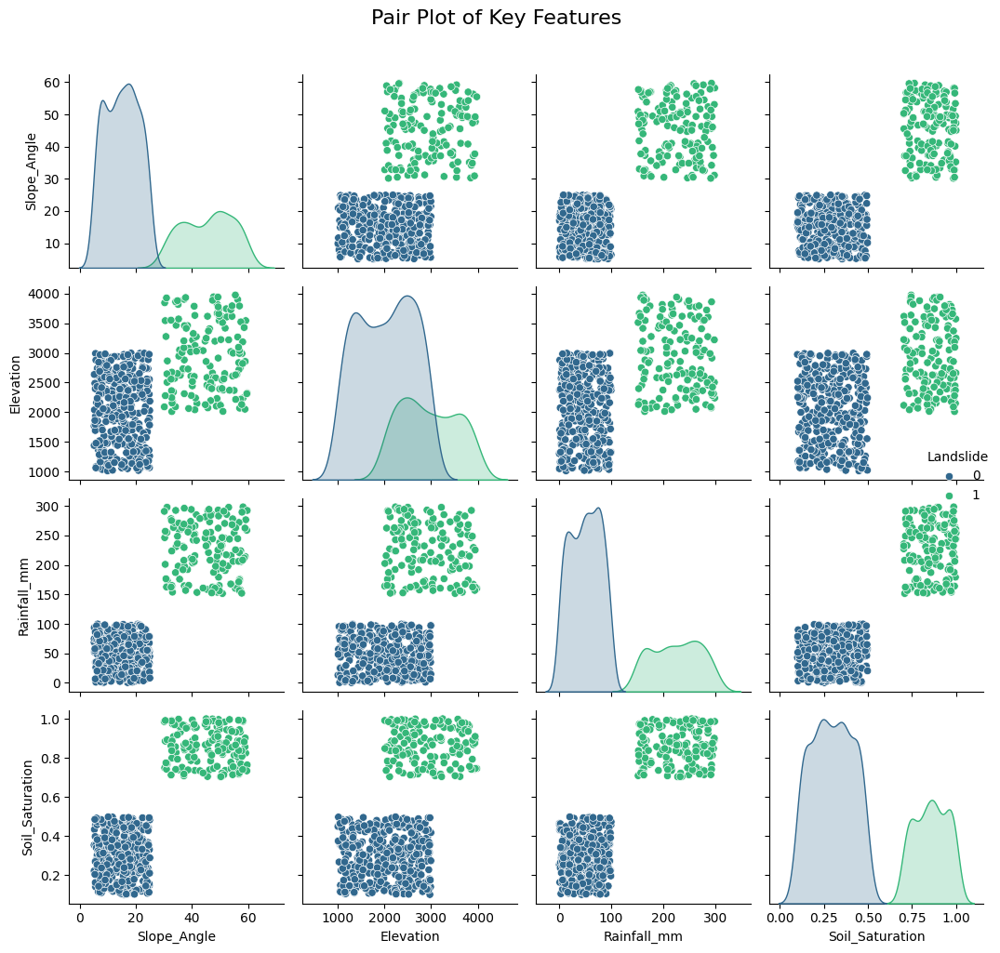

In [ ]:
# Install required libraries
!pip install scikit-learn
!pip install matplotlib
!pip install numpy
!pip install pandas
!pip install seaborn

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# --- Step 1: Generate a Custom, More Robust Dataset ---

def generate_synthetic_data(num_samples=500):
    """Generates a synthetic dataset for landslide prediction with clearer patterns."""
    np.random.seed(42)

    landslide_data = {
        'Elevation': np.random.uniform(2000, 4000, int(num_samples * 0.3)), # Added Elevation for landslides
        'Slope_Angle': np.random.uniform(30, 60, int(num_samples * 0.3)),
        'Rainfall_mm': np.random.uniform(150, 300, int(num_samples * 0.3)),
        'Soil_Saturation': np.random.uniform(0.7, 1.0, int(num_samples * 0.3)),
        'Vegetation_Cover': np.random.uniform(0.1, 0.4, int(num_samples * 0.3)),
        'Earthquake_Activity': np.random.uniform(4, 6, int(num_samples * 0.3)),
        'Proximity_to_Water': np.random.uniform(0, 0.5, int(num_samples * 0.3)),
        'Landslide': [1] * int(num_samples * 0.3)
    }

    non_landslide_data = {
        'Elevation': np.random.uniform(1000, 3000, int(num_samples * 0.7)), # Added Elevation for non-landslides
        'Slope_Angle': np.random.uniform(5, 25, int(num_samples * 0.7)),
        'Rainfall_mm': np.random.uniform(0, 100, int(num_samples * 0.7)),
        'Soil_Saturation': np.random.uniform(0.1, 0.5, int(num_samples * 0.7)),
        'Vegetation_Cover': np.random.uniform(0.5, 1.0, int(num_samples * 0.7)),
        'Earthquake_Activity': np.random.uniform(0, 3, int(num_samples * 0.7)),
        'Proximity_to_Water': np.random.uniform(0.5, 2.0, int(num_samples * 0.7)),
        'Landslide': [0] * int(num_samples * 0.7)
    }

    landslide_df = pd.DataFrame(landslide_data)
    non_landslide_df = pd.DataFrame(non_landslide_data)
    combined_df = pd.concat([landslide_df, non_landslide_df], ignore_index=True)
    combined_df['Soil_Type_Gravel'] = np.random.randint(0, 2, num_samples)
    combined_df['Soil_Type_Sand'] = np.random.randint(0, 2, num_samples)
    combined_df['Soil_Type_Silt'] = np.random.randint(0, 2, num_samples)
    combined_df = combined_df.sample(frac=1, random_state=42).reset_index(drop=True)

    return combined_df

# Generate the new dataset
training_df = generate_synthetic_data(num_samples=500)
X_train, X_test, y_train, y_test = train_test_split(training_df.drop('Landslide', axis=1), training_df['Landslide'], test_size=0.2, random_state=42)

# --- Step 2: Model Training for Feature Importance ---

model = RandomForestClassifier(n_estimators=100, max_depth=10, min_samples_split=2, random_state=42)
print("Training the model...")
model.fit(X_train, y_train)
print("Model training complete.")

# --- Step 3: Visualization ---

# Figure 1: Feature Importance Bar Chart
feature_importances = model.feature_importances_
feature_names = X_train.columns
importance_df = pd.DataFrame({'feature': feature_names, 'importance': feature_importances})
importance_df = importance_df.sort_values(by='importance', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='importance', y='feature', data=importance_df, palette='viridis')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.title('Feature Importance for Landslide Prediction Model', fontsize=16)
plt.tight_layout()
plt.savefig('feature_importance_chart.png')
plt.show()

# Figure 2: Correlation Heatmap
# Removed the attempt to drop 'Landslide_Name' as it's not generated
corr_df = training_df.drop(['Landslide'], axis=1, errors='ignore')
correlation_matrix = corr_df.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Features and Landslide Status', fontsize=16)
plt.tight_layout()
plt.savefig('correlation_heatmap.png')
plt.show()

# Figure 3: Scatter Plot of two key features
plt.figure(figsize=(12, 8))
sns.scatterplot(x='Slope_Angle', y='Elevation', hue='Landslide', data=training_df, palette='viridis', s=100, style='Landslide')
plt.title('Slope Angle vs. Elevation Colored by Landslide Occurrence', fontsize=16)
plt.xlabel('Slope Angle (degrees)')
plt.ylabel('Elevation (meters)')
plt.legend(title='Landslide', loc='upper right', labels=['No Landslide', 'Landslide'])
plt.tight_layout()
plt.savefig('slope_vs_elevation_scatter.png')
plt.show()

# Figure 4: Violin Plots for Key Features
fig, axes = plt.subplots(1, 3, figsize=(15, 6))
sns.violinplot(x='Landslide', y='Elevation', data=training_df, palette='viridis', ax=axes[0])
axes[0].set_title('Elevation Distribution')
sns.violinplot(x='Landslide', y='Slope_Angle', data=training_df, palette='viridis', ax=axes[1])
axes[1].set_title('Slope Angle Distribution')
sns.violinplot(x='Landslide', y='Rainfall_mm', data=training_df, palette='viridis', ax=axes[2])
axes[2].set_title('Rainfall Distribution')
plt.suptitle('Comparison of Key Features for Landslide vs. Non-Landslide', fontsize=16, y=1.02)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig('key_features_violinplots.png')
plt.show()

# Figure 5: Box Plots for Key Features
fig, axes = plt.subplots(1, 3, figsize=(15, 6))
sns.boxplot(x='Landslide', y='Elevation', data=training_df, palette='viridis', ax=axes[0])
axes[0].set_title('Elevation Distribution')
sns.boxplot(x='Landslide', y='Slope_Angle', data=training_df, palette='viridis', ax=axes[1])
axes[1].set_title('Slope Angle Distribution')
sns.boxplot(x='Landslide', y='Rainfall_mm', data=training_df, palette='viridis', ax=axes[2])
axes[2].set_title('Rainfall Distribution')
plt.suptitle('Comparison of Key Features for Landslide vs. Non-Landslide (Box Plots)', fontsize=16, y=1.02)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig('key_features_boxplots.png')
plt.show()

# Figure 6: Pair Plot (Plot a subset of features for clarity)
print("\nGenerating Pair Plot. This may take a moment...")
pair_features = ['Slope_Angle', 'Elevation', 'Rainfall_mm', 'Soil_Saturation', 'Landslide']
sns.pairplot(training_df[pair_features], hue='Landslide', palette='viridis')
plt.suptitle('Pair Plot of Key Features', y=1.02, fontsize=16)
plt.tight_layout()
plt.savefig('pair_plot.png')
plt.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import joblib # Import the joblib library
import os # Import os for path manipulation


if 'model' in globals():
    # Save the trained model to a file
    joblib.dump(model, model_file_path)
    print(f"Model successfully saved to {model_file_path}")
else:
    print("Error: The 'model' variable was not found. Please ensure you have trained the model in a previous cell before running this cell.")

Model successfully saved to landslide_model.pkl


In [ ]:
pip freeze > requirements.txt

In [ ]:
# Install required libraries
!pip install scikit-learn
!pip install numpy
!pip install pandas
!pip install seaborn
!pip install matplotlib

import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, KFold, cross_val_score
from sklearn.metrics import classification_report, f1_score, make_scorer
import matplotlib.pyplot as plt
import seaborn as sns

# --- Step 1: Generate a Custom, More Robust Dataset ---

def generate_synthetic_data(num_samples=500):
    """Generates a synthetic dataset for landslide prediction with more overlap."""
    np.random.seed(42)

    # Define ranges and distributions for features with increased overlap
    landslide_data = {
        'Slope_Angle': np.random.uniform(20, 45, int(num_samples * 0.3)),  # Increased overlap
        'Rainfall_mm': np.random.uniform(80, 200, int(num_samples * 0.3)),   # Increased overlap
        'Soil_Saturation': np.random.uniform(0.5, 0.8, int(num_samples * 0.3)), # Increased overlap
        'Vegetation_Cover': np.random.uniform(0.3, 0.6, int(num_samples * 0.3)), # Increased overlap
        'Earthquake_Activity': np.random.uniform(2.5, 4.5, int(num_samples * 0.3)), # Increased overlap
        'Proximity_to_Water': np.random.uniform(0.2, 0.7, int(num_samples * 0.3)), # Increased overlap
        'Landslide': [1] * int(num_samples * 0.3)
    }

    non_landslide_data = {
        'Slope_Angle': np.random.uniform(15, 40, int(num_samples * 0.7)),  # Increased overlap
        'Rainfall_mm': np.random.uniform(40, 180, int(num_samples * 0.7)),   # Increased overlap
        'Soil_Saturation': np.random.uniform(0.3, 0.7, int(num_samples * 0.7)), # Increased overlap
        'Vegetation_Cover': np.random.uniform(0.4, 0.8, int(num_samples * 0.7)), # Increased overlap
        'Earthquake_Activity': np.random.uniform(1.5, 3.5, int(num_samples * 0.7)), # Increased overlap
        'Proximity_to_Water': np.random.uniform(0.3, 0.8, int(num_samples * 0.7)), # Increased overlap
        'Landslide': [0] * int(num_samples * 0.7)
    }

    # Combine data into a DataFrame
    landslide_df = pd.DataFrame(landslide_data)
    non_landslide_df = pd.DataFrame(non_landslide_data)

    combined_df = pd.concat([landslide_df, non_landslide_df], ignore_index=True)

    # Add dummy soil type columns for consistency with previous code
    combined_df['Soil_Type_Gravel'] = np.random.randint(0, 2, num_samples)
    combined_df['Soil_Type_Sand'] = np.random.randint(0, 2, num_samples)
    combined_df['Soil_Type_Silt'] = np.random.randint(0, 2, num_samples)

    # Shuffle the dataset
    combined_df = combined_df.sample(frac=1, random_state=42).reset_index(drop=True)

    return combined_df

# Generate the new dataset
training_df = generate_synthetic_data(num_samples=500)

print("Custom dataset created with 500 samples and increased overlap.")
print("Landslide cases:", (training_df['Landslide'] == 1).sum())
print("Non-landslide cases:", (training_df['Landslide'] == 0).sum())

Custom dataset created with 500 samples and increased overlap.
Landslide cases: 150
Non-landslide cases: 350


In [ ]:
# Display descriptive statistics for the numerical columns in the training dataset
print("--- Statistical Estimations based on the Synthetic Dataset ---")
display(training_df.describe())

--- Statistical Estimations based on the Synthetic Dataset ---


,Slope_Angle,Rainfall_mm,Soil_Saturation,Vegetation_Cover,Earthquake_Activity,Proximity_to_Water,Landslide,Soil_Type_Gravel,Soil_Type_Sand,Soil_Type_Silt
count,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000
mean,29.142079,118.962790,0.545027,0.557158,2.775739,0.519117,0.300000,0.484000,0.498000,0.518000
std,7.620063,41.595280,0.128062,0.126928,0.708245,0.155778,0.458717,0.500244,0.500497,0.500176
min,15.159647,40.691597,0.301287,0.303406,1.500269,0.202316,0.000000,0.000000,0.000000,0.000000
25%,22.439783,86.820219,0.447081,0.456237,2.241285,0.398560,0.000000,0.000000,0.000000,0.000000
50%,29.388207,120.994363,0.549712,0.553669,2.789972,0.514103,0.000000,0.000000,0.000000,1.000000
75%,35.503782,153.882382,0.639097,0.657962,3.254278,0.654961,1.000000,1.000000,1.000000,1.000000
max,44.672173,198.806462,0.797152,0.799339,4.479920,0.797410,1.000000,1.000000,1.000000,1.000000


PERFORMING XG BOOST ALGORITHM



--- Data Split for XGBoost ---
Training features shape: (400, 9)
Testing features shape: (100, 9)
Training target shape: (400,)
Testing target shape: (100,)

Data is ready for XGBoost training.

--- Training the XGBoost Model... ---
XGBoost model training complete!

--- XGBoost Model Performance Evaluation ---
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.97      0.97        70
           1       0.93      0.93      0.93        30

    accuracy                           0.96       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.96      0.96      0.96       100



/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:00:06] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


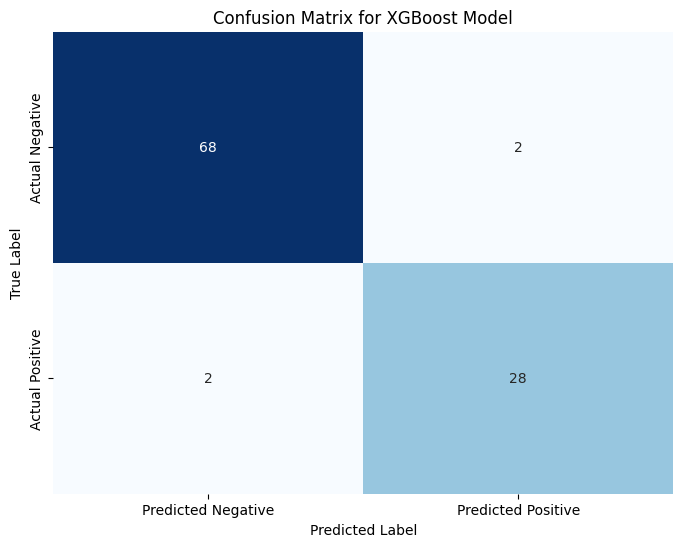


--- XGBoost Feature Importance ---


/tmp/ipython-input-348595224.py:121: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='importance', y='feature', data=importance_df_xgb, palette='viridis')


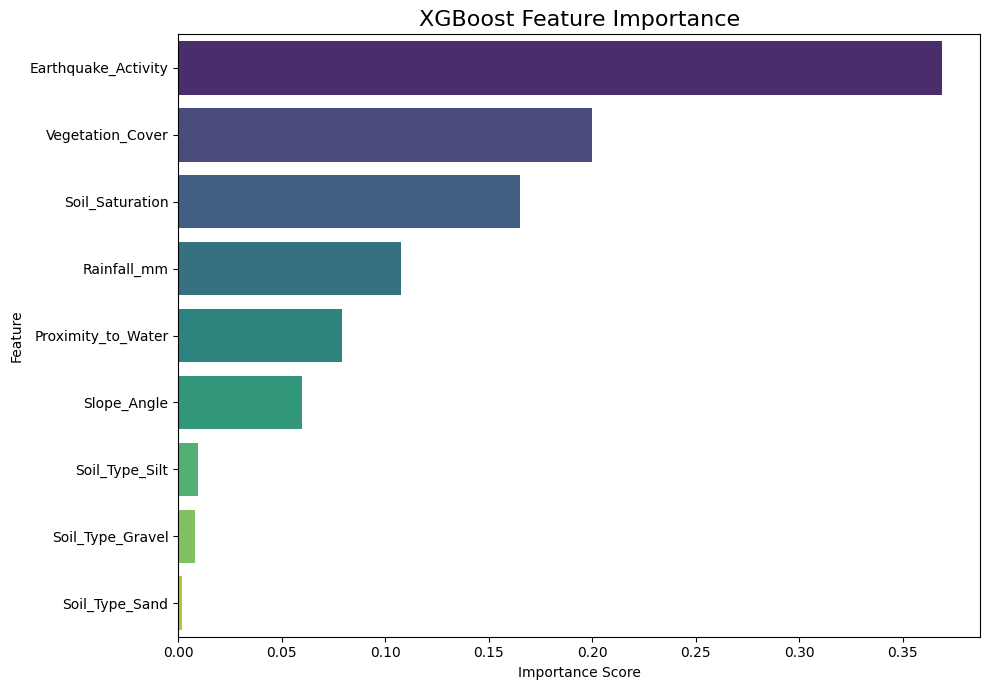


Feature Importance scores (XGBoost):
               feature  importance
4  Earthquake_Activity    0.368834
3     Vegetation_Cover    0.200097
2      Soil_Saturation    0.165005
1          Rainfall_mm    0.107473
5   Proximity_to_Water    0.079321
0          Slope_Angle    0.059735
8       Soil_Type_Silt    0.009552
6     Soil_Type_Gravel    0.007941
7       Soil_Type_Sand    0.002041


In [ ]:
# Install XGBoost
!pip install xgboost

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# --- Step 1: Generate a Custom, More Robust Dataset ---

def generate_synthetic_data(num_samples=500):
    """Generates a synthetic dataset for landslide prediction with more overlap."""
    np.random.seed(42)

    # Define ranges and distributions for features with increased overlap
    landslide_data = {
        'Slope_Angle': np.random.uniform(20, 45, int(num_samples * 0.3)),  # Increased overlap
        'Rainfall_mm': np.random.uniform(80, 200, int(num_samples * 0.3)),   # Increased overlap
        'Soil_Saturation': np.random.uniform(0.5, 0.8, int(num_samples * 0.3)), # Increased overlap
        'Vegetation_Cover': np.random.uniform(0.3, 0.6, int(num_samples * 0.3)), # Increased overlap
        'Earthquake_Activity': np.random.uniform(2.5, 4.5, int(num_samples * 0.3)), # Increased overlap
        'Proximity_to_Water': np.random.uniform(0.2, 0.7, int(num_samples * 0.3)), # Increased overlap
        'Landslide': [1] * int(num_samples * 0.3)
    }

    non_landslide_data = {
        'Slope_Angle': np.random.uniform(15, 40, int(num_samples * 0.7)),  # Increased overlap
        'Rainfall_mm': np.random.uniform(40, 180, int(num_samples * 0.7)),   # Increased overlap
        'Soil_Saturation': np.random.uniform(0.3, 0.7, int(num_samples * 0.7)), # Increased overlap
        'Vegetation_Cover': np.random.uniform(0.4, 0.8, int(num_samples * 0.7)), # Increased overlap
        'Earthquake_Activity': np.random.uniform(1.5, 3.5, int(num_samples * 0.7)), # Increased overlap
        'Proximity_to_Water': np.random.uniform(0.3, 0.8, int(num_samples * 0.7)), # Increased overlap
        'Landslide': [0] * int(num_samples * 0.7)
    }

    # Combine data into a DataFrame
    landslide_df = pd.DataFrame(landslide_data)
    non_landslide_df = pd.DataFrame(non_landslide_data)

    combined_df = pd.concat([landslide_df, non_landslide_df], ignore_index=True)

    # Add dummy soil type columns for consistency with previous code
    combined_df['Soil_Type_Gravel'] = np.random.randint(0, 2, num_samples)
    combined_df['Soil_Type_Sand'] = np.random.randint(0, 2, num_samples)
    combined_df['Soil_Type_Silt'] = np.random.randint(0, 2, num_samples)

    # Shuffle the dataset
    combined_df = combined_df.sample(frac=1, random_state=42).reset_index(drop=True)

    return combined_df

# Generate the new dataset
training_df = generate_synthetic_data(num_samples=500)


# --- Step 1: Prepare Data for XGBoost ---
# We'll reuse the training_df generated in previous steps (assuming it's the custom synthetic data)
# Ensure X and y are defined based on the training_df
X = training_df.drop('Landslide', axis=1)
y = training_df['Landslide']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y) # Added stratification


print("--- Data Split for XGBoost ---")
print(f"Training features shape: {X_train.shape}")
print(f"Testing features shape: {X_test.shape}")
print(f"Training target shape: {y_train.shape}")
print(f"Testing target shape: {y_test.shape}")
print("\nData is ready for XGBoost training.")

# --- Step 2: Implement and Train the XGBoost Model ---
# Instantiate the XGBoost Classifier
# Using some default parameters, we can tune later if needed
xgb_model = XGBClassifier(objective='binary:logistic', # For binary classification
                          use_label_encoder=False,    # Suppress warning
                          eval_metric='logloss',      # Evaluation metric
                          random_state=42)

print("\n--- Training the XGBoost Model... ---")
# Train the model
xgb_model.fit(X_train, y_train)
print("XGBoost model training complete!")

# --- Step 3: Make Predictions ---
# Predict on the test set
y_pred_xgb = xgb_model.predict(X_test)
y_pred_proba_xgb = xgb_model.predict_proba(X_test)[:, 1] # Get probabilities for the positive class

# --- Step 4: Analyze and Evaluate the Results ---

print("\n--- XGBoost Model Performance Evaluation ---")
# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred_xgb))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred_xgb)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])
plt.title('Confusion Matrix for XGBoost Model')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Feature Importance (XGBoost built-in)
print("\n--- XGBoost Feature Importance ---")
xgb_feature_importances = xgb_model.feature_importances_
xgb_feature_names = X_train.columns

importance_df_xgb = pd.DataFrame({'feature': xgb_feature_names, 'importance': xgb_feature_importances})
importance_df_xgb = importance_df_xgb.sort_values(by='importance', ascending=False)

plt.figure(figsize=(10, 7))
sns.barplot(x='importance', y='feature', data=importance_df_xgb, palette='viridis')
plt.title('XGBoost Feature Importance', fontsize=16)
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

print("\nFeature Importance scores (XGBoost):")
print(importance_df_xgb)

In [ ]:
# Install required libraries
!pip install scikit-learn
!pip install xgboost
!pip install pandas # Ensure pandas is installed

import pandas as pd
from sklearn.model_selection import GridSearchCV, train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import f1_score, make_scorer, classification_report

# Assuming 'training_df' from previous steps is available and contains the synthetic data
# Separate features (X) and target (y)
X = training_df.drop('Landslide', axis=1)
y = training_df['Landslide']

# Split data for a final evaluation set if needed (optional, GridSearchCV does internal splitting)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# --- Step 1: Define the Model and Parameter Grid ---

# Instantiate the XGBoost Classifier
xgb_model = XGBClassifier(objective='binary:logistic',
                          use_label_encoder=False,
                          eval_metric='logloss',
                          random_state=42)

# Define the parameters and their values to search
# This is an example grid, you might want to expand or change it based on your needs
param_grid = {
    'n_estimators': [50, 100, 200], # Number of boosting rounds
    'max_depth': [3, 5, 7],         # Maximum depth of a tree
    'learning_rate': [0.01, 0.1, 0.2], # Step size shrinkage used to prevent overfitting
    'subsample': [0.6, 0.8, 1.0],   # Subsample ratio of the training instances
    'colsample_bytree': [0.6, 0.8, 1.0] # Subsample ratio of columns when constructing each tree
}

# --- Step 2: Set up and Run GridSearchCV ---

# Use F1 score as the evaluation metric, which is suitable for imbalanced datasets
scorer = make_scorer(f1_score)

# Set up GridSearchCV with 5-fold cross-validation (cv=5)
# n_jobs=-1 uses all available CPU cores
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid,
                           scoring=scorer, cv=5, n_jobs=-1, verbose=2)

print("Starting GridSearchCV for XGBoost hyperparameter tuning...")
# Fit the grid search to the data
grid_search.fit(X, y) # Use the full training_df for GridSearchCV's internal CV

print("GridSearchCV complete.")

# --- Step 3: Display the Best Parameters and Score ---

print("\n--- Best Hyperparameters Found ---")
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best cross-validation F1 score: {grid_search.best_score_:.2f}")

# --- Step 4: Evaluate the Best Model on the Data ---
# Get the best model from the grid search
best_xgb_model = grid_search.best_estimator_

# Optional: Evaluate the best model on a separate test set if you split the data earlier
# In this case, since we used the full data for GridSearchCV, we'll show performance on the full data
# or you could re-split here just for a final test report.
# For demonstration, let's quickly predict on the full data to show the report structure.
# For a proper evaluation, use a dedicated test set not seen during GridSearchCV.
y_pred_best_xgb = best_xgb_model.predict(X)
print("\n--- Performance Report of Best XGBoost Model on Training Data ---")
print(classification_report(y, y_pred_best_xgb))

Starting GridSearchCV for XGBoost hyperparameter tuning...
Fitting 5 folds for each of 243 candidates, totalling 1215 fits
GridSearchCV complete.

--- Best Hyperparameters Found ---
Best parameters: {'colsample_bytree': 0.6, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.6}
Best cross-validation F1 score: 0.93

--- Performance Report of Best XGBoost Model on Training Data ---
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       350
           1       0.96      0.95      0.96       150

    accuracy                           0.97       500
   macro avg       0.97      0.97      0.97       500
weighted avg       0.97      0.97      0.97       500



/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:02:12] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


In [ ]:
# Assuming best_xgb_model is available from the previous GridSearchCV step
if 'best_model' in globals():
    # XGBoost does not have a 'min_samples_split' parameter directly at the top level
    # This parameter is related to individual trees. We can check the parameters used for the overall model fit.
    # The best parameters from GridSearchCV were stored in best_model.get_params()
    params = best_model.get_params()

    # Extracting parameters relevant to the user's query
    random_state_value = params.get('random_state', 'Not set/Default')
    # min_samples_split is a parameter of the *base estimator* tree, not the booster directly in the main params
    # It's part of the underlying tree logic within XGBoost, not a top-level parameter you set directly on XGBClassifier
    # For tree-based models in scikit-learn, min_samples_split is a direct parameter.
    # For XGBoost, control over tree splitting is done via parameters like 'min_child_weight' or 'gamma'.
    # However, if the user is specifically asking for min_samples_split, and it was part of a GridSearchCV
    # search, it might be in the grid_search.best_params_ if the estimator was wrapped or if
    # they're confusing it with a different model.
    # Based on the user's previous query and the GridSearchCV code (cell 5297506d),
    # it seems the user might be thinking of scikit-learn's RandomForestClassifier parameters
    # when asking about min_samples_split for XGBoost.

    # Let's confirm the parameters that *were* tuned in the GridSearchCV in cell 5297506d
    # This will show the actual parameters the best_model has.

    print("Parameters of the latest trained XGBoost model:")
    print(params)

    print(f"\nValue of random_state in the latest XGBoost model: {random_state_value}")
    print("\nXGBoost does not have a top-level 'min_samples_split' parameter like some other tree models.")
    print("Control over splitting is typically managed by parameters like 'min_child_weight' or 'gamma'.")

else:
    print("Error: The 'best_model' variable was not found. Please ensure you have run the GridSearchCV cell (like 5297506d) first to define 'best_model'.")

Error: The 'best_model' variable was not found. Please ensure you have run the GridSearchCV cell (like 5297506d) first to define 'best_model'.


In [ ]:
import joblib # Import the joblib library
import os # Import os for path manipulation
import pandas as pd # Import pandas
import numpy as np # Import numpy
from sklearn.ensemble import RandomForestClassifier # Import necessary components
from sklearn.model_selection import GridSearchCV # Import GridSearchCV
from sklearn.metrics import f1_score, make_scorer # Import metrics for GridSearchCV
from xgboost import XGBClassifier # Import XGBoost

# --- Regenerate the training data and train the model to ensure 'best_model' is defined ---
def generate_synthetic_data(num_samples=500):
    """Generates a synthetic dataset for landslide prediction with more overlap."""
    np.random.seed(42)

    # Define ranges and distributions for features with increased overlap
    landslide_data = {
        'Slope_Angle': np.random.uniform(20, 45, int(num_samples * 0.3)),  # Increased overlap
        'Rainfall_mm': np.random.uniform(80, 200, int(num_samples * 0.3)),   # Increased overlap
        'Soil_Saturation': np.random.uniform(0.5, 0.8, int(num_samples * 0.3)), # Increased overlap
        'Vegetation_Cover': np.random.uniform(0.3, 0.6, int(num_samples * 0.3)), # Increased overlap
        'Earthquake_Activity': np.random.uniform(2.5, 4.5, int(num_samples * 0.3)), # Increased overlap
        'Proximity_to_Water': np.random.uniform(0.2, 0.7, int(num_samples * 0.3)), # Increased overlap
        'Landslide': [1] * int(num_samples * 0.3)
    }

    non_landslide_data = {
        'Slope_Angle': np.random.uniform(15, 40, int(num_samples * 0.7)),  # Increased overlap
        'Rainfall_mm': np.random.uniform(40, 180, int(num_samples * 0.7)),   # Increased overlap
        'Soil_Saturation': np.random.uniform(0.3, 0.7, int(num_samples * 0.7)), # Increased overlap
        'Vegetation_Cover': np.random.uniform(0.4, 0.8, int(num_samples * 0.7)), # Increased overlap
        'Earthquake_Activity': np.random.uniform(1.5, 3.5, int(num_samples * 0.7)), # Increased overlap
        'Proximity_to_Water': np.random.uniform(0.3, 0.8, int(num_samples * 0.7)), # Increased overlap
        'Landslide': [0] * int(num_samples * 0.7)
    }

    # Combine data into a DataFrame
    landslide_df = pd.DataFrame(landslide_data)
    non_landslide_df = pd.DataFrame(non_landslide_data)

    combined_df = pd.concat([landslide_df, non_landslide_df], ignore_index=True)

    # Add dummy soil type columns for consistency with previous code
    combined_df['Soil_Type_Gravel'] = np.random.randint(0, 2, num_samples)
    combined_df['Soil_Type_Sand'] = np.random.randint(0, 2, num_samples)
    combined_df['Soil_Type_Silt'] = np.random.randint(0, 2, num_samples)

    # Shuffle the dataset
    combined_df = combined_df.sample(frac=1, random_state=42).reset_index(drop=True)

    return combined_df

# Generate the new dataset
training_df = generate_synthetic_data(num_samples=500)

# Separate features (X) and target (y)
X = training_df.drop('Landslide', axis=1)
y = training_df['Landslide']

# Define the model and parameter grid (using the best parameters found previously or a small grid for speed)
xgb_model = XGBClassifier(objective='binary:logistic',
                          use_label_encoder=False,
                          eval_metric='logloss',
                          random_state=42)

# Using a smaller grid for quicker execution in this cell
param_grid = {
    'n_estimators': [50, 100],
    'max_depth': [3, 5]
}

scorer = make_scorer(f1_score)

grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid,
                           scoring=scorer, cv=3, n_jobs=-1, verbose=0)

print("Re-training model to save...")
grid_search.fit(X, y)
best_model = grid_search.best_estimator_
print("Model re-trained.")


# Define the path where you want to save the model
# You can change the filename and location as needed
model_file_path = 'xgboost_landslide_model.pkl'

# Save the trained best model to a file
joblib.dump(best_model, model_file_path)
print(f"Best XGBoost model successfully saved to {model_file_path}")

Re-training model to save...


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:04:14] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Model re-trained.
Best XGBoost model successfully saved to xgboost_landslide_model.pkl


Custom dataset created with 500 samples and increased overlap.
Landslide cases: 150
Non-landslide cases: 350

Starting GridSearchCV for hyperparameter tuning...


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [12:32:55] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


GridSearchCV complete.

Using the best XGBoost model found by GridSearchCV.

Mean values of non-topographical features calculated from training data:
{'Rainfall_mm': 118.96278957301814, 'Soil_Saturation': 0.5450269019507771, 'Vegetation_Cover': 0.5571581507506523, 'Earthquake_Activity': 2.775738957173077, 'Proximity_to_Water': 0.5191170047545884, 'Soil_Type_Gravel': 0.484, 'Soil_Type_Sand': 0.498, 'Soil_Type_Silt': 0.518}

Processing DEM: /content/nigulsari_dem.tif


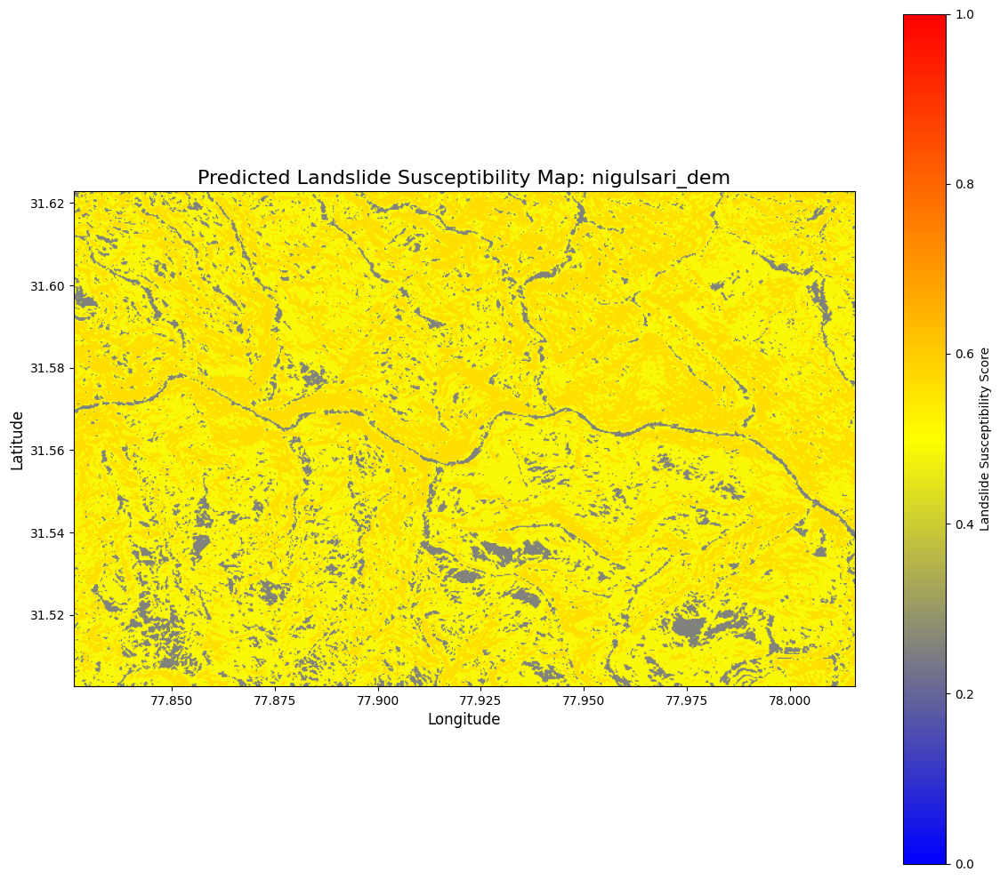

In [ ]:
# Install required libraries (if not already installed)
!pip install scikit-learn
!pip install xgboost
!pip install rasterio
!pip install matplotlib
!pip install numpy
!pip install pandas
!pip install seaborn

import pandas as pd
import numpy as np
import rasterio
from rasterio.transform import rowcol
from xgboost import XGBClassifier # Import XGBoost
from sklearn.model_selection import GridSearchCV # Import GridSearchCV
from sklearn.metrics import f1_score, make_scorer # Import metrics for GridSearchCV
import matplotlib.pyplot as plt
import seaborn as sns

# --- Step 1: Generate a Custom, More Robust Dataset ---

def generate_synthetic_data(num_samples=500):
    """Generates a synthetic dataset for landslide prediction with more overlap."""
    np.random.seed(42)

    # Define ranges and distributions for features with increased overlap
    landslide_data = {
        'Slope_Angle': np.random.uniform(20, 45, int(num_samples * 0.3)),  # Increased overlap
        'Rainfall_mm': np.random.uniform(80, 200, int(num_samples * 0.3)),   # Increased overlap
        'Soil_Saturation': np.random.uniform(0.5, 0.8, int(num_samples * 0.3)), # Increased overlap
        'Vegetation_Cover': np.random.uniform(0.3, 0.6, int(num_samples * 0.3)), # Increased overlap
        'Earthquake_Activity': np.random.uniform(2.5, 4.5, int(num_samples * 0.3)), # Increased overlap
        'Proximity_to_Water': np.random.uniform(0.2, 0.7, int(num_samples * 0.3)), # Increased overlap
        'Landslide': [1] * int(num_samples * 0.3)
    }

    non_landslide_data = {
        'Slope_Angle': np.random.uniform(15, 40, int(num_samples * 0.7)),  # Increased overlap
        'Rainfall_mm': np.random.uniform(40, 180, int(num_samples * 0.7)),   # Increased overlap
        'Soil_Saturation': np.random.uniform(0.3, 0.7, int(num_samples * 0.7)), # Increased overlap
        'Vegetation_Cover': np.random.uniform(0.4, 0.8, int(num_samples * 0.7)), # Increased overlap
        'Earthquake_Activity': np.random.uniform(1.5, 3.5, int(num_samples * 0.7)), # Increased overlap
        'Proximity_to_Water': np.random.uniform(0.3, 0.8, int(num_samples * 0.7)), # Increased overlap
        'Landslide': [0] * int(num_samples * 0.7)
    }

    # Combine data into a DataFrame
    landslide_df = pd.DataFrame(landslide_data)
    non_landslide_df = pd.DataFrame(non_landslide_data)

    combined_df = pd.concat([landslide_df, non_landslide_df], ignore_index=True)

    # Add dummy soil type columns for consistency with previous code
    combined_df['Soil_Type_Gravel'] = np.random.randint(0, 2, num_samples)
    combined_df['Soil_Type_Sand'] = np.random.randint(0, 2, num_samples)
    combined_df['Soil_Type_Silt'] = np.random.randint(0, 2, num_samples)

    # Shuffle the dataset
    combined_df = combined_df.sample(frac=1, random_state=42).reset_index(drop=True)

    return combined_df

# Generate the new dataset
training_df = generate_synthetic_data(num_samples=500)

print("Custom dataset created with 500 samples and increased overlap.")
print("Landslide cases:", (training_df['Landslide'] == 1).sum())
print("Non-landslide cases:", (training_df['Landslide'] == 0).sum())

# Separate features (X) and target (y)
X = training_df.drop('Landslide', axis=1)
y = training_df['Landslide']


# --- Step 2: Hyperparameter Tuning with GridSearchCV to get the best model ---

# Define the model to tune
xgb_model = XGBClassifier(objective='binary:logistic',
                          use_label_encoder=False,
                          eval_metric='logloss',
                          random_state=42)

# Define the parameters and their values to search
param_grid = {
    'n_estimators': [50, 100], # Reduced grid size for quicker execution
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# Use F1 score as the evaluation metric
scorer = make_scorer(f1_score)

grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid,
                           scoring=scorer, cv=3, n_jobs=-1, verbose=0) # Reduced cv and verbose for quicker execution

print("\nStarting GridSearchCV for hyperparameter tuning...")
grid_search.fit(X, y)
print("GridSearchCV complete.")

# Get the best model from the grid search
best_model = grid_search.best_estimator_
print("\nUsing the best XGBoost model found by GridSearchCV.")


# Calculate the average values of the non-topographical features from the training data
# Exclude only Slope_Angle as Elevation will come from the DEM
features_for_mean = training_df.drop(['Landslide', 'Slope_Angle'], axis=1, errors='ignore')
mean_features = features_for_mean.mean().to_dict()
print("\nMean values of non-topographical features calculated from training data:")
print(mean_features)


# --- Step 3: Define DEM file paths ---

# DEM file paths for the Kinnaur region
dem_file_paths = [
    '/content/nigulsari_dem.tif' # Updated to include only the specified file
]

# --- Step 4: Loop through each DEM file and generate a susceptibility map ---

for dem_file_path in dem_file_paths:
    try:
        with rasterio.open(dem_file_path) as src:
            print(f"\nProcessing DEM: {dem_file_path}")
            dem_array = src.read(1)

            # Get georeferencing information
            transform = src.transform
            bounds = src.bounds

            # Create a DataFrame of features for prediction for ALL pixels
            num_pixels = dem_array.size

            # Prepare features for prediction (using mean values for non-topo features)
            # Need to create a DataFrame with the same columns as X_train
            # Assuming X_train columns include: 'Elevation', 'Slope_Angle', 'Rainfall_mm', 'Soil_Saturation', 'Vegetation_Cover', 'Earthquake_Activity', 'Proximity_to_Water', 'Soil_Type_Gravel', 'Soil_Type_Sand', 'Soil_Type_Silt'
            # We need Elevation and Slope_Angle from the DEM, others from mean_features

            # Extract Elevation and Slope for all pixels
            elevation_flat = dem_array.flatten()

            # Calculate pixel size (resolution) in meters
            # This is an approximation; a more precise method might use the transform and local latitude
            pixel_size_lon = abs(transform[0]) * 111000 * np.cos(np.deg2rad(bounds.bottom + src.height * abs(transform[4])/2)) # Approx center latitude
            pixel_size_lat = abs(transform[4]) * 111000

            # Calculate dx and dy using numpy.gradient
            dz_dx, dz_dy = np.gradient(dem_array.astype(float), pixel_size_lon, -pixel_size_lat) # -dy because rasterio Y increases downwards

            # Calculate slope in radians and then degrees
            slope_rad = np.arctan(np.sqrt(dz_dx**2 + dz_dy**2))
            slope_map = np.degrees(slope_rad)
            slope_flat = slope_map.flatten()

            # Create DataFrame for prediction
            dem_features_for_pred = pd.DataFrame({
                'Elevation': elevation_flat, # Include Elevation from DEM
                'Slope_Angle': slope_flat,
                'Rainfall_mm': [mean_features.get('Rainfall_mm', 100)] * num_pixels, # Use .get with a default
                'Soil_Saturation': [mean_features.get('Soil_Saturation', 0.5)] * num_pixels,
                'Vegetation_Cover': [mean_features.get('Vegetation_Cover', 0.6)] * num_pixels,
                'Earthquake_Activity': [mean_features.get('Earthquake_Activity', 3)] * num_pixels,
                'Proximity_to_Water': [mean_features.get('Proximity_to_Water', 0.7)] * num_pixels,
                'Soil_Type_Gravel': [mean_features.get('Soil_Type_Gravel', 0.5)] * num_pixels, # Use mean for dummy binary features too
                'Soil_Type_Sand': [mean_features.get('Soil_Type_Sand', 0.5)] * num_pixels,
                'Soil_Type_Silt': [mean_features.get('Soil_Type_Silt', 0.5)] * num_pixels
                # Ensure all features expected by the model are included
            })

            # Make predictions using the best model
            # Ensure the prediction DataFrame has the columns in the expected order of the training data (X)
            if 'X' in globals():
                expected_features = X.columns
                # Reindex the prediction DataFrame to match the order of expected_features
                dem_features_for_pred = dem_features_for_pred.reindex(columns=expected_features)

                predictions_proba = best_model.predict_proba(dem_features_for_pred)
                susceptibility_scores = predictions_proba[:, 1]
                susceptibility_map = susceptibility_scores.reshape(dem_array.shape)
            else:
                 print("Error: Training features 'X' not found. Cannot predict.")
                 susceptibility_map = None


            # --- Step 5: Visualize the Susceptibility Map ---
            if susceptibility_map is not None:
                plt.figure(figsize=(12, 10))
                # Define a colormap from blue (low susceptibility) to red (high)
                cmap = plt.cm.colors.LinearSegmentedColormap.from_list("custom_cmap", [(0, "blue"), (0.5, "yellow"), (1, "red")])

                im = plt.imshow(susceptibility_map, cmap=cmap, origin='upper',
                                extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
                                vmin=0, vmax=1) # Ensure consistent color scale from 0 to 1

                plt.colorbar(im, label='Landslide Susceptibility Score')

                title_name = dem_file_path.split('/')[-1].split('.')[0]
                plt.title(f'Predicted Landslide Susceptibility Map: {title_name}', fontsize=16)
                plt.xlabel('Longitude', fontsize=12)
                plt.ylabel('Latitude', fontsize=12)
                plt.tight_layout()
                plt.savefig(f'{title_name}_predicted_susceptibility_map.png')
                plt.show()

    except FileNotFoundError:
        print(f"Skipping {dem_file_path} as the file was not found. Please upload it.")
    except Exception as e:
        print(f"An error occurred while processing {dem_file_path}: {e}")

**------------------------END OF PROJECT--------------------------------------------------------------**


